#Import Library

In [117]:
from tqdm import tqdm # Library untuk bar progrss
import time
import warnings # Library untuk handle warning
warnings.filterwarnings('ignore') # Untuk mengignore beberapa warning yang kurang penting

# Library pemrosesan data
import pandas as pd
import numpy as np

# Library untuk menyimpan data
from google.colab import files

# Library untuk visualisasi data
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
try:
  import windrose
except ImportError:
  !pip install windrose
from windrose import WindroseAxes
import ipywidgets as widgets
from IPython.display import display
from statsmodels.tsa.seasonal import seasonal_decompose

# Library untuk metrik dan model selection
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import (
    KFold,
    cross_val_predict as cvp,
    cross_val_score as cvs
)
from sklearn.feature_selection import mutual_info_regression

# Library-library untuk model prediksi
!pip install catboost lightgbm
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error
import xgboost as xgb
import lightgbm as lgb
from sklearn.neighbors import KNeighborsRegressor
import catboost as cb

# Library untuk melakukan Hyperparameter Tuning
!pip install optuna
import optuna

# Library untuk menyimpan model
import pickle

In [118]:
# Supaya dapat melihat seluruh kolom
pd.set_option('display.max_columns', None)

In [119]:
# Inisiasi random state
SEED = 42

# Import Data

In [120]:
!gdown 1FRT9v2_At4xRuRI3dfPHmOBoCFLWH2sd
!gdown 16tY1OR4uveQDkd1DGDefz7SnN9yJwRWg
!gdown 1ZgXW9eVz54zi4zzsQ7yw-aEr8w7Te6Vh
!gdown 1C0lLbPvDCLGpfc9tyu0EdRxPDZa1mWgL
!gdown 1idMKdhkX5PaJZ2xkJIa58ExpCWCCepPj


Downloading...
From: https://drive.google.com/uc?id=1FRT9v2_At4xRuRI3dfPHmOBoCFLWH2sd
To: /content/daily_train.csv
100% 2.77M/2.77M [00:00<00:00, 20.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=16tY1OR4uveQDkd1DGDefz7SnN9yJwRWg
To: /content/daily_test.csv
100% 805k/805k [00:00<00:00, 11.4MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1ZgXW9eVz54zi4zzsQ7yw-aEr8w7Te6Vh
From (redirected): https://drive.google.com/uc?id=1ZgXW9eVz54zi4zzsQ7yw-aEr8w7Te6Vh&confirm=t&uuid=8c687876-104c-4ad3-b514-decf0ef8ac17
To: /content/hourly_train.csv
100% 84.6M/84.6M [00:01<00:00, 53.7MB/s]
Downloading...
From: https://drive.google.com/uc?id=1C0lLbPvDCLGpfc9tyu0EdRxPDZa1mWgL
To: /content/hourly_test.csv
100% 25.3M/25.3M [00:00<00:00, 33.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1idMKdhkX5PaJZ2xkJIa58ExpCWCCepPj
To: /content/location.csv
100% 576/576 [00:00<00:00, 1.85MB/s]


In [121]:
# Load datasets
daily_train = pd.read_csv('/content/daily_train.csv')
daily_test = pd.read_csv('/content/daily_test.csv')
hourly_train = pd.read_csv('/content/hourly_train.csv')
hourly_test = pd.read_csv('/content/hourly_test.csv')
loc = pd.read_csv('/content/location.csv')

In [ ]:
# Inspect data
print(daily_train.info())
print(daily_test.info())
print(hourly_train.info())
print(hourly_test.info())
print(loc.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19704 entries, 0 to 19703
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               19704 non-null  object 
 1   location_id                      19704 non-null  int64  
 2   time                             19704 non-null  object 
 3   temperature_2m_max (°C)          19704 non-null  float64
 4   temperature_2m_min (°C)          19704 non-null  float64
 5   temperature_2m_mean (°C)         19704 non-null  float64
 6   apparent_temperature_max (°C)    19704 non-null  float64
 7   apparent_temperature_min (°C)    19704 non-null  float64
 8   apparent_temperature_mean (°C)   19704 non-null  float64
 9   sunrise (iso8601)                19704 non-null  object 
 10  sunset (iso8601)                 19704 non-null  object 
 11  daylight_duration (s)            19704 non-null  float64
 12  sunshine_duration 

# EDA & Pre-Processing

## Train



In [ ]:
daily_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19704 entries, 0 to 19703
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               19704 non-null  object 
 1   location_id                      19704 non-null  int64  
 2   time                             19704 non-null  object 
 3   temperature_2m_max (°C)          19704 non-null  float64
 4   temperature_2m_min (°C)          19704 non-null  float64
 5   temperature_2m_mean (°C)         19704 non-null  float64
 6   apparent_temperature_max (°C)    19704 non-null  float64
 7   apparent_temperature_min (°C)    19704 non-null  float64
 8   apparent_temperature_mean (°C)   19704 non-null  float64
 9   sunrise (iso8601)                19704 non-null  object 
 10  sunset (iso8601)                 19704 non-null  object 
 11  daylight_duration (s)            19704 non-null  float64
 12  sunshine_duration 

In [ ]:
hourly_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 472896 entries, 0 to 472895
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   location_id                              472896 non-null  int64  
 1   time                                     472896 non-null  object 
 2   temperature_2m (°C)                      472896 non-null  float64
 3   relative_humidity_2m (%)                 472896 non-null  float64
 4   dew_point_2m (°C)                        472896 non-null  float64
 5   apparent_temperature (°C)                472896 non-null  float64
 6   pressure_msl (hPa)                       472896 non-null  float64
 7   surface_pressure (hPa)                   472896 non-null  float64
 8   cloud_cover (%)                          472896 non-null  float64
 9   cloud_cover_low (%)                      472896 non-null  float64
 10  cloud_cover_mid (%)             

In [ ]:
daily_train.head()

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
0,loc1_20190101,1,2019-01-01,26.8,24.2,25.4,31.6,27.1,28.8,2019-01-01T05:41,2019-01-01T18:10,44897.80,0.00,9.6,22.7,44.3,258.0,7.40,1.87
1,loc1_20190102,1,2019-01-02,30.5,24.4,26.6,36.2,27.1,29.8,2019-01-02T05:42,2019-01-02T18:10,44892.38,35722.88,1.9,20.9,48.2,257.0,17.07,4.00
2,loc1_20190103,1,2019-01-03,30.1,24.2,26.4,33.0,26.6,29.2,2019-01-03T05:42,2019-01-03T18:10,44886.42,19345.55,8.3,24.5,52.2,254.0,12.78,3.31
3,loc1_20190104,1,2019-01-04,31.8,23.5,27.5,36.4,27.5,31.3,2019-01-04T05:43,2019-01-04T18:11,44879.96,42275.59,0.4,15.0,34.9,271.0,24.47,5.48
4,loc1_20190105,1,2019-01-05,30.7,24.4,27.5,35.9,28.1,31.9,2019-01-05T05:43,2019-01-05T18:11,44873.00,42270.64,0.7,14.9,33.8,292.0,22.64,4.82


In [ ]:
hourly_train.head()

,location_id,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
0,1,2019-01-01 00:00:00,25.5,85.0,22.7,27.5,1010.1,1009.4,88.0,0.0,66.0,75.0,0.04,0.50,22.7,35.7,252.0,251.0,43.9,27.7,29.4,28.9,29.0,0.352,0.36,0.363,0.347,0.0,0.0,0.0,0.0,0.0
1,1,2019-01-01 01:00:00,25.2,86.0,22.7,27.7,1009.6,1008.9,89.0,0.0,20.0,87.0,0.03,0.45,18.9,30.4,262.0,259.0,44.3,27.5,29.2,28.9,29.0,0.352,0.36,0.363,0.347,0.0,0.0,0.0,0.0,0.0
2,1,2019-01-01 02:00:00,25.1,86.0,22.6,27.7,1009.5,1008.8,97.0,0.0,24.0,97.0,0.03,0.44,17.9,29.0,260.0,256.0,36.4,27.3,29.1,28.9,29.0,0.352,0.36,0.363,0.347,0.0,0.0,0.0,0.0,0.0
3,1,2019-01-01 03:00:00,24.9,87.0,22.7,28.0,1009.7,1009.0,99.0,0.0,58.0,98.0,0.02,0.40,15.0,24.8,260.0,257.0,34.9,27.1,29.0,28.9,29.0,0.352,0.36,0.363,0.347,0.0,0.0,0.0,0.0,0.0
4,1,2019-01-01 04:00:00,24.9,88.0,22.8,28.1,1010.1,1009.4,100.0,9.0,99.0,100.0,0.02,0.37,14.4,23.5,267.0,264.0,28.8,27.0,28.8,28.9,29.0,0.353,0.36,0.363,0.347,0.0,0.0,0.0,0.0,0.0


### Missing Value and Duplicate

In [ ]:
# Check for duplicate rows and missing values
print("\nNumber of duplicate rows in daily_train:", daily_train.duplicated().sum())
print("Number of duplicate rows in hourly_train:", hourly_train.duplicated().sum())
print("\nMissing values in daily_train:\n", daily_train.isnull().sum())
print("\nMissing values in hourly_train:\n", hourly_train.isnull().sum())


Number of duplicate rows in daily_train: 0
Number of duplicate rows in hourly_train: 0

Missing values in daily_train:
 ID                                 0
location_id                        0
time                               0
temperature_2m_max (°C)            0
temperature_2m_min (°C)            0
temperature_2m_mean (°C)           0
apparent_temperature_max (°C)      0
apparent_temperature_min (°C)      0
apparent_temperature_mean (°C)     0
sunrise (iso8601)                  0
sunset (iso8601)                   0
daylight_duration (s)              0
sunshine_duration (s)              0
rain_sum (mm)                      0
wind_speed_10m_max (km/h)          0
wind_gusts_10m_max (km/h)          0
wind_direction_10m_dominant (°)    0
shortwave_radiation_sum (MJ/m²)    0
et0_fao_evapotranspiration (mm)    0
dtype: int64

Missing values in hourly_train:
 location_id                                0
time                                       0
temperature_2m (°C)                    

Tidak terdapat row duplikat ataupun missing value pada dataset daily_train dan hourly_train.

### Statistics Summary

In [ ]:
daily_train.describe().T

,count,mean,std,min,25%,50%,75%,max
location_id,19704.0,6.500000,3.452140,1.00,3.7500,6.500,9.2500,12.00
temperature_2m_max (°C),19704.0,30.180994,2.247493,21.80,28.6000,30.100,31.5000,39.90
temperature_2m_min (°C),19704.0,23.028350,1.904473,13.80,22.2000,23.400,24.3000,27.90
temperature_2m_mean (°C),19704.0,26.120676,1.739846,20.70,25.2000,26.300,27.3000,31.30
apparent_temperature_max (°C),19704.0,35.139444,2.558647,23.90,33.5000,35.500,37.0000,43.10
apparent_temperature_min (°C),19704.0,26.752345,2.862154,13.80,25.5000,27.400,28.7000,33.10
apparent_temperature_mean (°C),19704.0,30.288474,2.325849,20.60,29.2000,30.800,32.0000,35.80
daylight_duration (s),19704.0,43579.269557,1061.953764,41924.22,42551.4975,43532.530,44599.7750,45358.29
sunshine_duration (s),19704.0,33191.281265,8766.887690,0.00,28800.0000,37276.065,39469.2675,42429.95
rain_sum (mm),19704.0,6.998518,11.103593,0.00,0.4000,2.900,9.6000,343.80


In [ ]:
hourly_train.describe().T

,count,mean,std,min,25%,50%,75%,max
location_id,472896.0,6.500000,3.452056,1.000,3.750,6.500,9.250,12.00
temperature_2m (°C),472896.0,26.125369,2.988995,13.800,24.200,25.800,28.000,39.90
relative_humidity_2m (%),472896.0,80.197050,14.045442,12.000,73.000,84.000,91.000,100.00
dew_point_2m (°C),472896.0,22.120930,2.232395,-3.000,20.900,22.700,23.700,27.10
apparent_temperature (°C),472896.0,30.288149,3.512537,13.800,28.200,30.400,32.500,43.10
pressure_msl (hPa),472896.0,1010.239667,1.951204,1002.600,1008.900,1010.200,1011.600,1018.20
surface_pressure (hPa),472896.0,994.886063,22.866247,927.300,997.700,1002.500,1008.600,1015.90
cloud_cover (%),472896.0,76.288474,31.522674,0.000,58.000,94.000,100.000,100.00
cloud_cover_low (%),472896.0,18.701072,25.067215,0.000,2.000,9.000,24.000,100.00
cloud_cover_mid (%),472896.0,23.328210,27.321911,0.000,3.000,13.000,32.000,100.00


### Monthly Rain Sum by Location

In [ ]:
# Copy untuk keperluan EDA
dtrain = daily_train.copy()
htrain = hourly_train.copy()

# Ekstrak tahun dan bulan kolom time
dtrain['time'] = pd.to_datetime(dtrain['time'])
dtrain['year'] = dtrain['time'].dt.year
dtrain['month'] = dtrain['time'].dt.month
dtrain['day'] = dtrain['time'].dt.day

htrain['time'] = pd.to_datetime(htrain['time'])
htrain['year'] = htrain['time'].dt.year
htrain['month'] = htrain['time'].dt.month
htrain['day'] = htrain['time'].dt.day

# Merge dengan informasi dari dataset lokasi
dtrain = pd.merge(dtrain, loc[['location_id',  'elevation']], on='location_id', how='left')
htrain = pd.merge(htrain, loc[['location_id',  'elevation']], on='location_id', how='left')

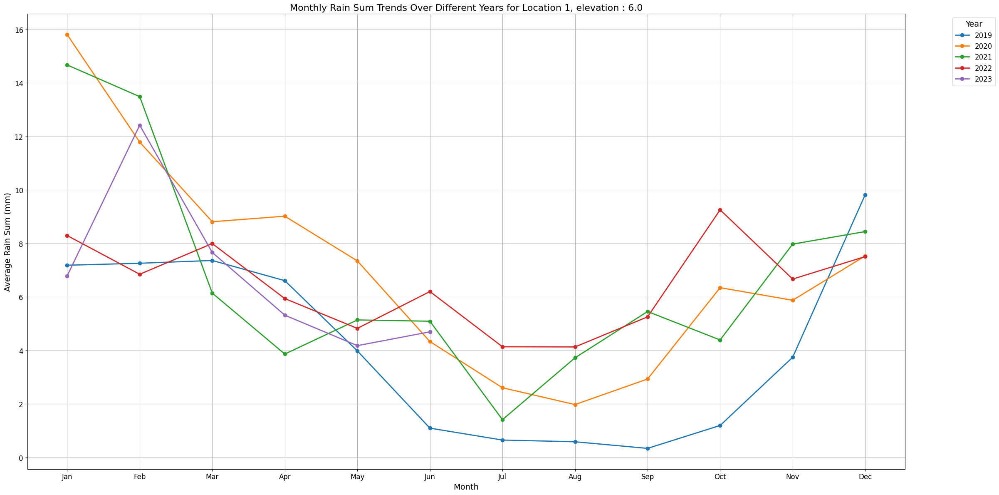

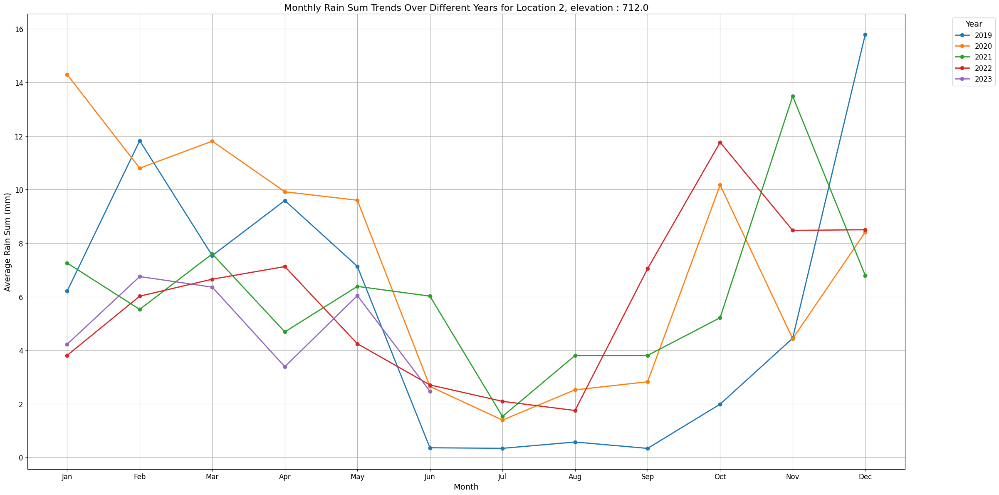

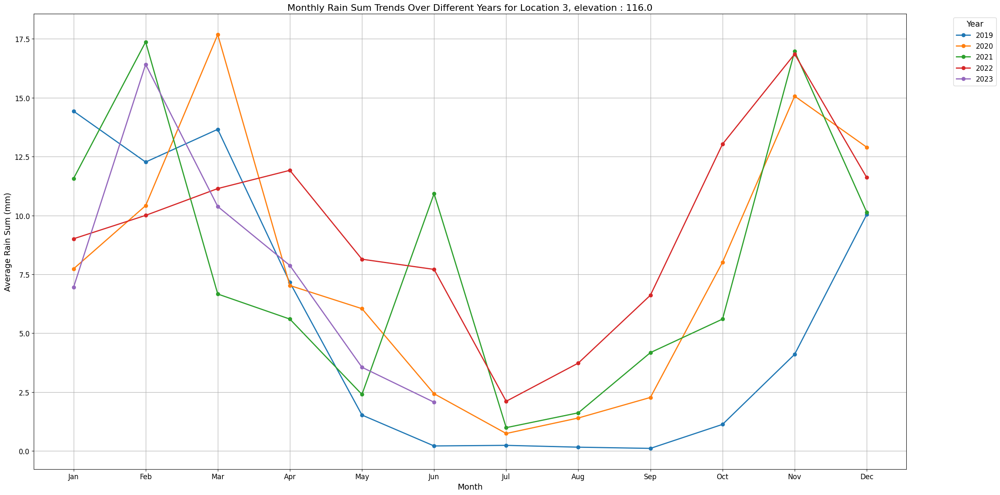

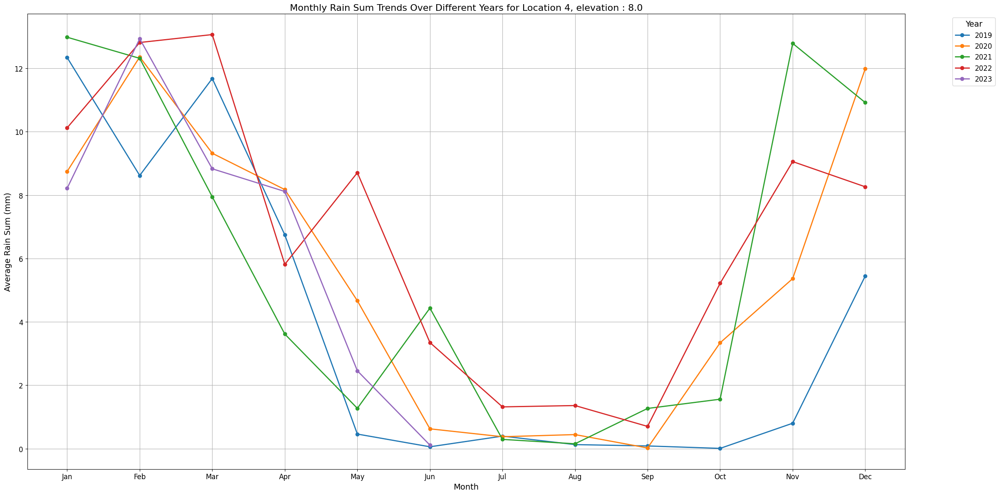

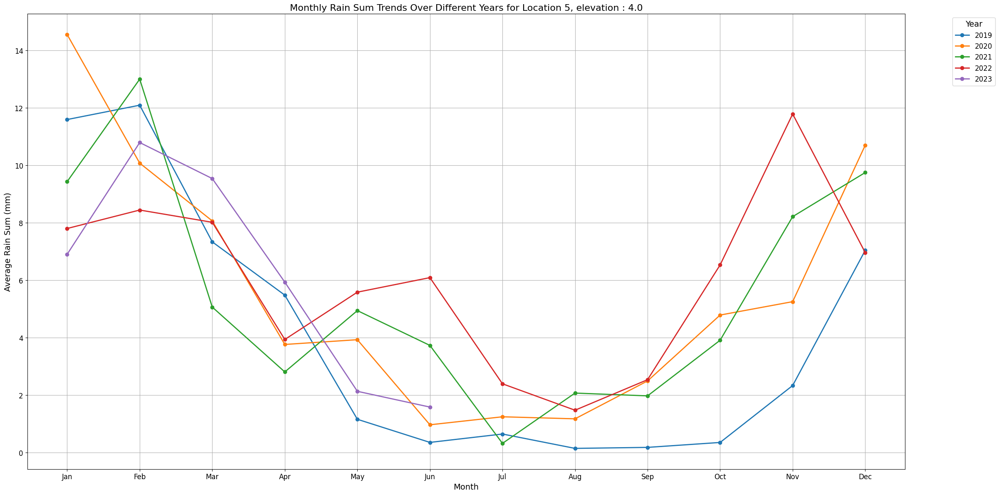

...

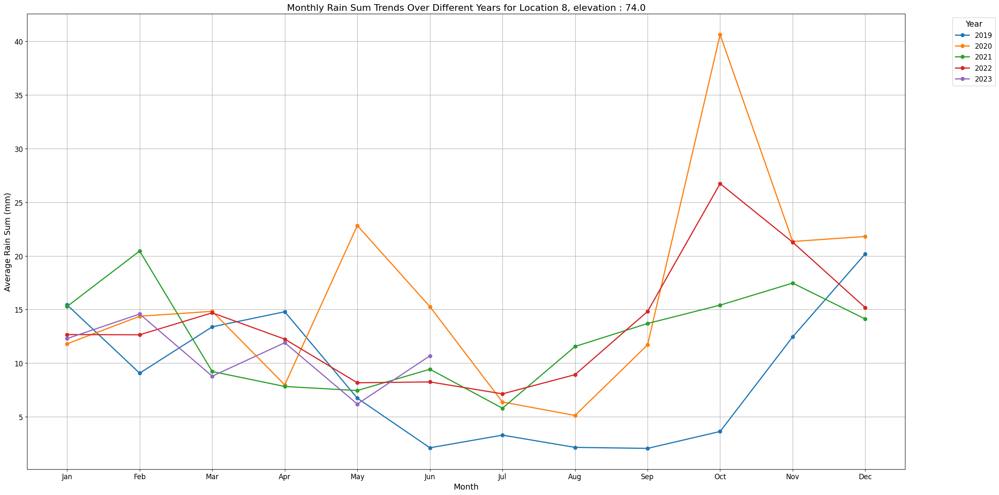

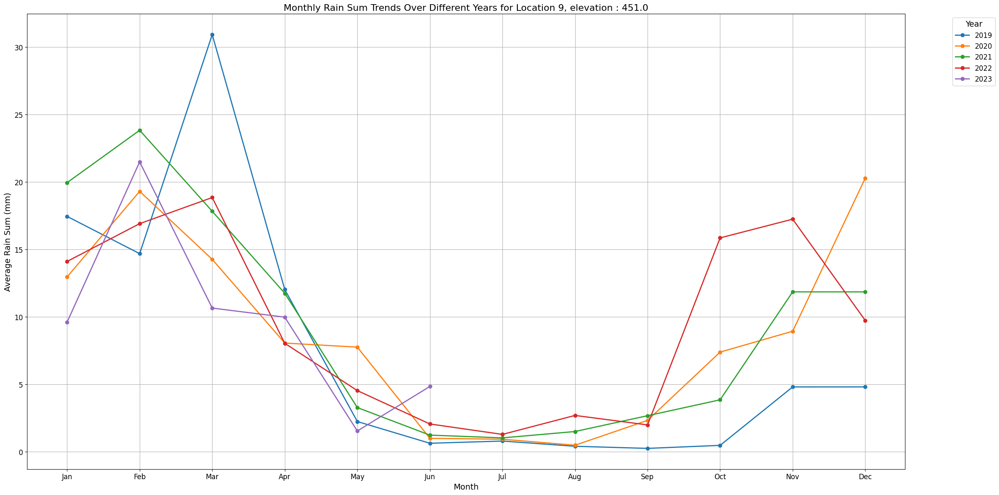

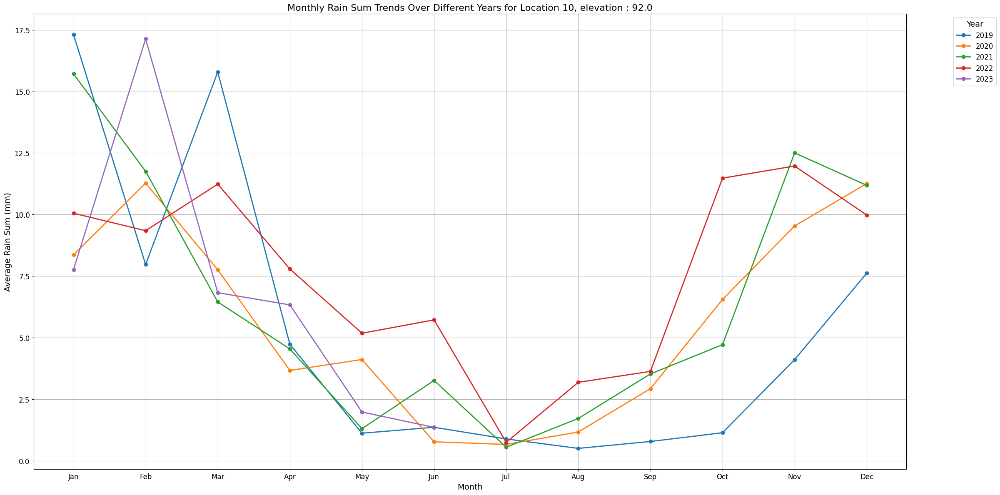

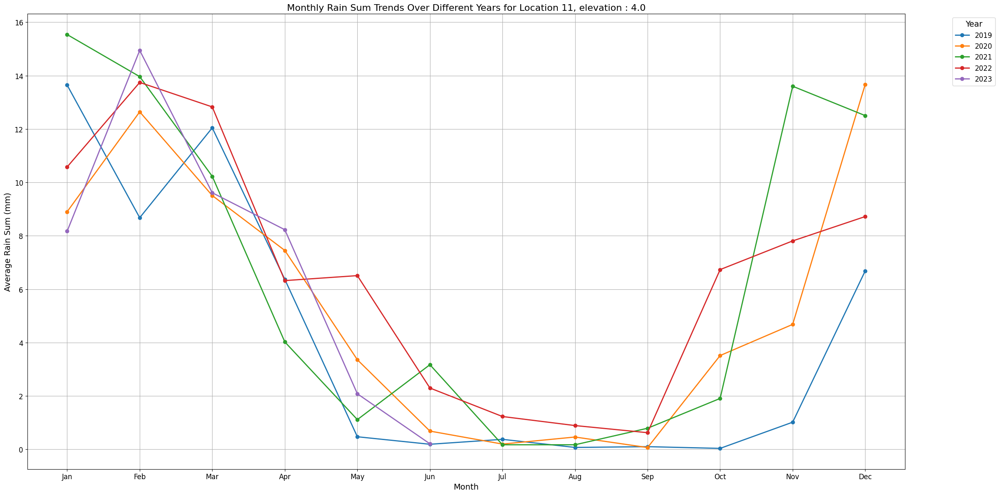

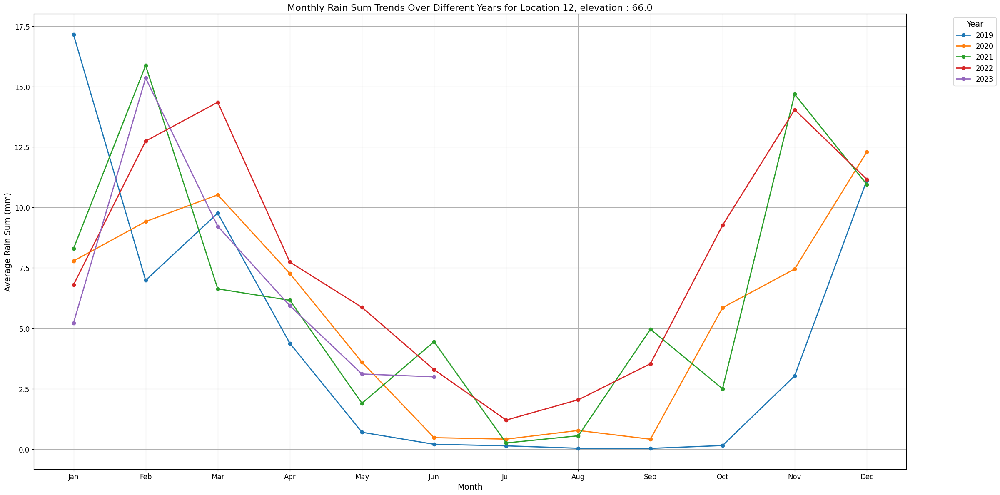

In [ ]:
# Line Chart for Rain Sum (monthly) over different years

for location_id in dtrain['location_id'].unique():
    location_data = dtrain[dtrain['location_id'] == location_id] # Filter per lokasi

    month_year_rain = location_data.groupby(['year', 'month'])['rain_sum (mm)'].mean().reset_index() # Agregat rata=rata per bulan
    month_year_pivot = month_year_rain.pivot(index='month', columns='year', values='rain_sum (mm)') # Pivot data per tahun

    # Plot data dengan matplotlib
    month_year_pivot.plot(marker='o', linewidth=2, figsize=(24, 12))
    plt.title(f"Monthly Rain Sum Trends Over Different Years for Location {location_id}, elevation : {loc.loc[location_id-1, 'elevation']}", fontsize=16)
    plt.xlabel("Month", fontsize=14)
    plt.ylabel("Average Rain Sum (mm)", fontsize=14)
    plt.xticks(ticks=range(1, 13), labels=["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"], fontsize=12)
    plt.yticks(fontsize=12)

    plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12, title_fontsize=14)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


Terlihat bahwa setiap tahun pasti ada tren penurunan (May - Sep) dan peningkatan curah hujan pada bulan-bulan tertentu. Pada beberapa lokasi dapat ditemukan rata-rata curah hujan yang cukup tinggi dibandingkan lainnya, seperti pada lokasi 8 dan 9.

In [ ]:
# Melihat curah hujan yang ekstem
dtrain[dtrain['rain_sum (mm)'] > 150]

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),year,month,day,elevation
754,loc1_20210124,1,2021-01-24,25.8,23.7,24.6,31.2,28.2,29.8,2021-01-24T05:52,2021-01-24T18:16,44655.05,0.00,150.4,9.5,25.9,236.0,4.15,0.98,2021,1,24,6.0
10217,loc7_20200101,7,2020-01-01,26.3,23.9,25.0,31.0,27.8,29.4,2020-01-01T05:33,2020-01-01T18:04,45015.41,0.00,152.6,19.1,39.6,296.0,5.61,1.14,2020,1,1,5.0
10591,loc7_20210109,7,2021-01-09,29.3,23.8,25.7,35.3,28.2,31.1,2021-01-09T05:38,2021-01-09T18:07,44948.61,27223.96,155.1,10.5,30.2,298.0,14.73,3.00,2021,1,9,5.0
11799,loc8_20191102,8,2019-11-02,25.6,23.4,24.0,30.0,28.2,28.9,2019-11-02T05:15,2019-11-02T17:37,44552.23,1310.23,159.7,9.6,27.7,188.0,3.95,0.94,2019,11,2,74.0
12157,loc8_20201025,8,2020-10-25,25.1,24.0,24.6,30.4,28.5,29.8,2020-10-25T05:17,2020-10-25T17:37,44389.55,2750.72,343.8,8.6,21.6,243.0,5.70,1.23,2020,10,25,74.0
13211,loc9_20190317,9,2019-03-17,23.2,21.2,22.2,27.7,25.3,26.4,2019-03-17T05:33,2019-03-17T17:42,43701.91,0.00,308.8,6.4,29.2,74.0,2.26,0.62,2019,3,17,451.0


Menurut [BMKG](https://www.bmkg.go.id/cuaca/probabilistik-curah-hujan.bmkg#:~:text=Ambang%20batas%20nilai%20yang%20digunakan%20untuk%20menentukan%20intensitas,%3E150%20mm%20%2F%20hari%20%28ungu%29%20%3A%20Hujan%20ekstrem), curah hujan >150 mm/hari berada pada kategori hujan ekstrem. Ini berarti curah hujan yang lebih dari 150 mm/hari dapat disebut sebagai cuaca ekstrem atau kejadian yang jarang terjadi. Terdapat lokasi-lokasi seperti Lokasi 8 dan Lokasi 9 yang mencatatkan curah hujan harian mencapai lebih dari 300 mm. Kemungkinan pada hari itu terjadi fenomena alam yang tidak biasa, seperti badai tropis atau curah hujan lebat yang berlangsung dalam waktu singkat.

Selanjutnya, kita akan mengeksplorasi salah satu kejadian curah hujan ekstrem, yaitu pada tanggal 17 Maret 2019 di lokasi 9.

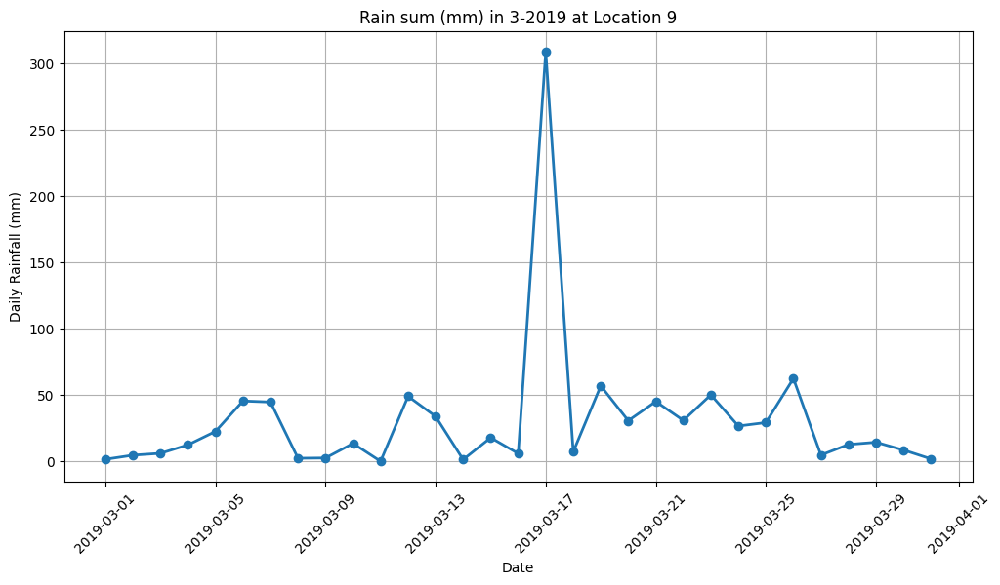

In [ ]:
# Filter kembali untuk bulan dan lokasi yang diinginkan
dtrain_eks = dtrain[(dtrain['year'] == 2019) & (dtrain['month'] == 3) & (dtrain['location_id'] == 9)]

# Extract unique values directly from df_feb_eda
year = dtrain_eks['year'].unique()[0]
month = dtrain_eks['month'].unique()[0]
location_id = dtrain_eks['location_id'].unique()[0]

# Plot data curah hujan harian
plt.figure(figsize=(12, 6))
plt.plot(dtrain_eks['time'], dtrain_eks['rain_sum (mm)'], marker='o', linestyle='-', linewidth=2)
plt.title(f"Rain sum (mm) in {month}-{year} at Location {location_id}")
plt.xlabel("Date")
plt.ylabel("Daily Rainfall (mm)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

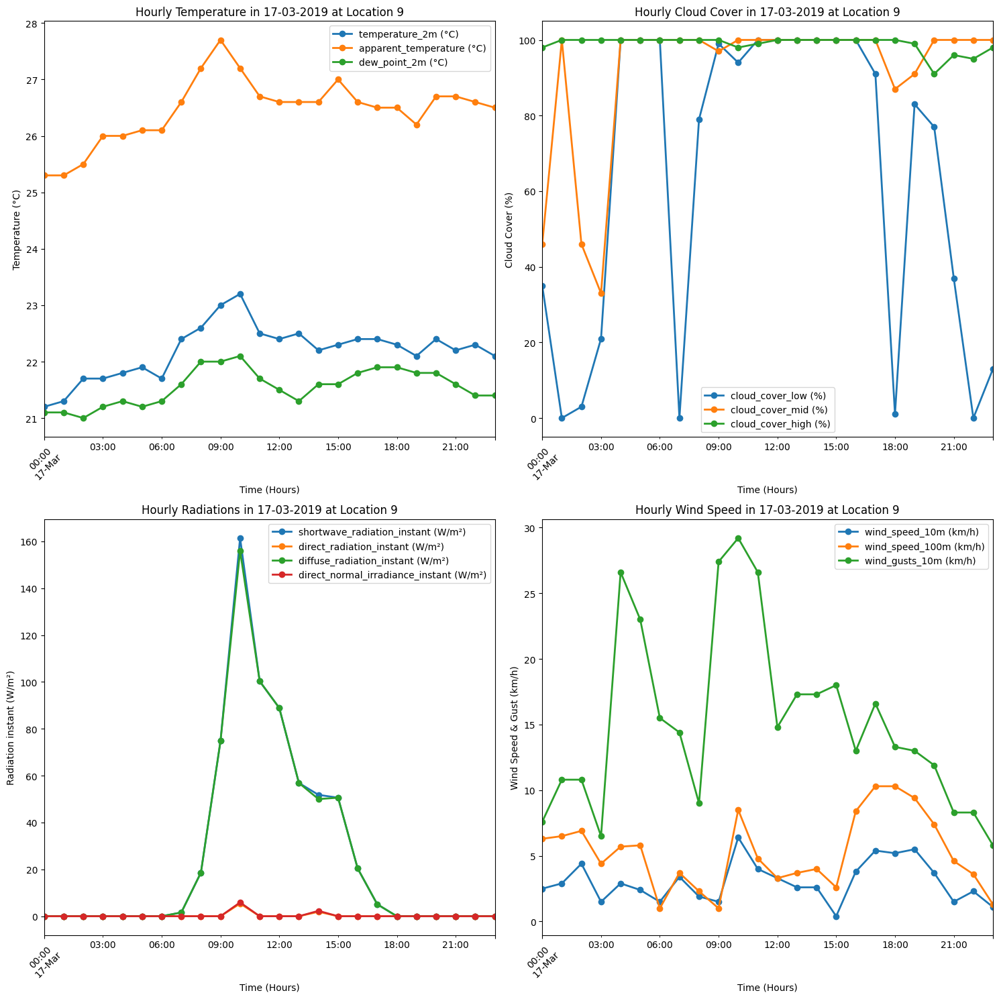

In [ ]:
# Plot per Hour for Extreme Rain_sum
# Define the filter conditions
date_filter = (htrain['year'] == 2019) & (htrain['month'] == 3) & (htrain['day'] == 17) & (htrain['location_id'] == 9)
year = htrain[date_filter]['year'].unique()[0]
month = htrain[date_filter]['month'].unique()[0]
day = htrain[date_filter]['day'].unique()[0]
location_id = htrain[date_filter]['location_id'].unique()[0]

# Extract the data
hourly_temp = htrain[date_filter][['time', 'temperature_2m (°C)', 'apparent_temperature (°C)', 'dew_point_2m (°C)']]
hourly_cloud = htrain[date_filter][['time', 'cloud_cover_low (%)', 'cloud_cover_mid (%)', 'cloud_cover_high (%)']]
hourly_rad = htrain[date_filter][['time', 'shortwave_radiation_instant (W/m²)', 'direct_radiation_instant (W/m²)',
                                  'diffuse_radiation_instant (W/m²)', 'direct_normal_irradiance_instant (W/m²)']]
hourly_wind = htrain[date_filter][['time', 'wind_speed_10m (km/h)', 'wind_speed_100m (km/h)','wind_gusts_10m (km/h)']]

hourly_temp.set_index('time', inplace=True)
hourly_cloud.set_index('time', inplace=True)
hourly_rad.set_index('time', inplace=True)
hourly_wind.set_index('time', inplace=True)

# Subplot
fig, axes = plt.subplots(2, 2, figsize=(15, 15))  # 1 row, 2 columns

# Plot temperature data
hourly_temp.plot(ax=axes[0,0], marker='o', linestyle='-', linewidth=2)
axes[0,0].set(title=f"Hourly Temperature in {day:02d}-{month:02d}-{year} at Location {location_id}",
            xlabel="Time (Hours)", ylabel="Temperature (°C)")
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot cloud cover data
hourly_cloud.plot(ax=axes[0, 1], marker='o', linestyle='-', linewidth=2)
axes[0, 1].set(title=f"Hourly Cloud Cover in {day:02d}-{month:02d}-{year} at Location {location_id}",
               xlabel="Time (Hours)", ylabel="Cloud Cover (%)")
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot radiation data
hourly_rad.plot(ax=axes[1,0], marker='o', linestyle='-', linewidth=2)
axes[1,0].set(title=f"Hourly Radiations in {day:02d}-{month:02d}-{year} at Location {location_id}",
              xlabel="Time (Hours)", ylabel="Radiation instant (W/m²)")
axes[1,0].tick_params(axis='x', rotation=45)

# Plot wind data
hourly_wind.plot(ax=axes[1,1], marker='o', linestyle='-', linewidth=2)
axes[1,1].set(title=f"Hourly Wind Speed in {day:02d}-{month:02d}-{year} at Location {location_id}",
              xlabel="Time (Hours)", ylabel="Wind Speed & Gust (km/h)")
axes[1,1].tick_params(axis='x', rotation=45)

# Show plot
plt.tight_layout()
plt.show()

Plot di atas menunjukkan keadaan alam ketika terjadi hujan ekstrem pada lokasi 9 (308.8 mm).
- Dew point (titik embun) stabil sepanjang hari (~21°C) dan hampir sama dengan suhu lingkungan, menunjukkan kadar **kelembapan yang relatif tinggi**. Ini mendukung pembentukan awan dan potensi hujan.<sup>[[1]](https://ejournal-pusdiklat.bmkg.go.id/index.php/climago/article/view/71/40)</sup>
- Cloud Cover (mid dan high) cenderung banyak sepanjang hari, menunjukkan adanya perkembangan awan konvektif. Awan konvektif adalah awan yang dihasilkan oleh proses konveksi akibat pemanasan radiasi surya.<sup>[[2]](https://d1wqtxts1xzle7.cloudfront.net/70247371/1823-libre.pdf?1632659375=&response-content-disposition=inline%3B+filename%3DPotensi_Atmosfer_Dalam_Pembentukan_Awan.pdf&Expires=1732547985&Signature=Z8HdBhFwSFIuFXZsY2Wr6sN5TPlbbDaZqqBrRN0UWLb7vFaNICpe56DaAcceRWdhnKvVBsrIU1XO0L7~GW0m3Gu2B1g1eMAw-ivVq~1fWai09yXb0DOKHwDYmsWEavuoz8gBmCHp5JAQSwebSaYX-QiBmtiXcpc71OMzbOt1LTQJ7E64SrwFae3zGazeR6Vey7Ve8bSVktk6cXeVp1CEVP3h~iskfp1klY5op-u-4pbJ~ORHPJj6L3OhrDbKDJpQYyZyqIS2rVAqG8XbizA~19w-n0UBlhefgf28D0GoDvt44DUn8vrKzu2am9TTAhJ7e9dWY5uh8WRFCB41hGdi~Q__&Key-Pair-Id=APKAJLOHF5GGSLRBV4ZA)</sup> Perkembangan  **awan  konvektif** sering  dikaitkan  dengan  **cuaca  buruk**  seperti badai petir, hujan lebat, tornado, angin kencang, hujan es, dan fenomena lainnya.<sup>[[3]](https://www.balai2bmkg.id/index.php/buletin_mkg/article/view/86/59)</sup>
- Pada grafik radiasi, terlihat bahwa `direct radiation` tetap rendah sepanjang hari, sedangkan diffuse radiation meningkat terutama di pagi-sore hari. Hal ini menunjukkan adanya tutupan awan yang cukup signifikan (sesuai dengan grafik `cloud cover`), sehingga radiasi langsung dari matahari terhambat dan lebih banyak tersebar oleh awan maupun partikel di atmosfer. Selain itu, direct normal irradiance hampir nol, menandakan bahwa kondisi atmosfer tidak mendukung penerimaan energi maksimum dari radiasi matahari karena sudut optimal terganggu oleh tutupan awan tebal.  
- Grafik angin menunjukkan kecepatan angin yang fluktuatif namun sering mengalami peningkatan signifikan. Ini menunjukkan adanya **aliran angin kuat** yang dapat **membawa massa udara lembap** ke lokasi tersebut, mendukung pembentukan awan hujan tebal.

Mari bandingkan plot di atas dengan plot fitur-fitur ketika hujan tidak ekstrem pada bulan, tahun, dan lokasi yang sama.

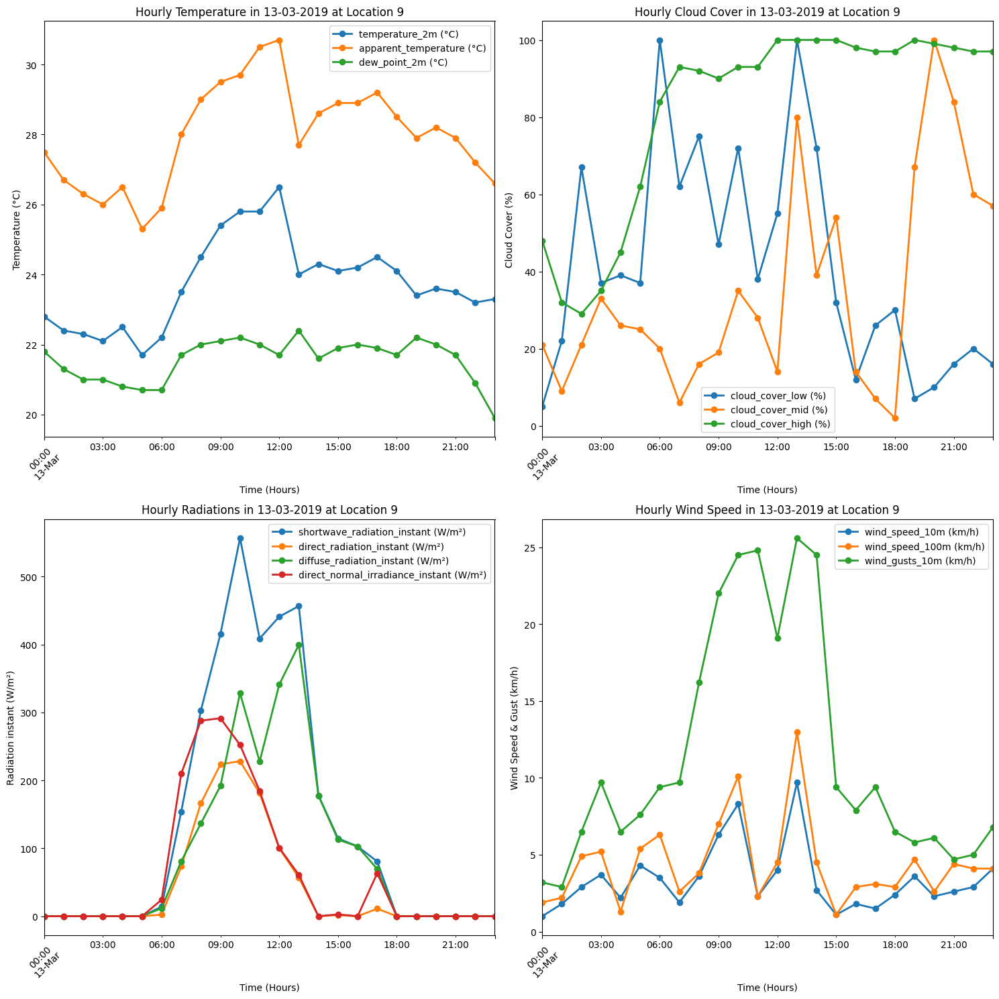

In [ ]:
# Plot per Hour for Not Extreme Rain_sum (34 mm)
# Define the filter conditions
date_filter = (htrain['year'] == 2019) & (htrain['month'] == 3) & (htrain['day'] ==13) & (htrain['location_id'] == 9)
year = htrain[date_filter]['year'].unique()[0]
month = htrain[date_filter]['month'].unique()[0]
day = htrain[date_filter]['day'].unique()[0]
location_id = htrain[date_filter]['location_id'].unique()[0]

# Extract the data
hourly_temp = htrain[date_filter][['time', 'temperature_2m (°C)', 'apparent_temperature (°C)', 'dew_point_2m (°C)']]
hourly_cloud = htrain[date_filter][['time', 'cloud_cover_low (%)', 'cloud_cover_mid (%)', 'cloud_cover_high (%)']]
hourly_rad = htrain[date_filter][['time', 'shortwave_radiation_instant (W/m²)', 'direct_radiation_instant (W/m²)',
                                  'diffuse_radiation_instant (W/m²)', 'direct_normal_irradiance_instant (W/m²)']]
hourly_wind = htrain[date_filter][['time', 'wind_speed_10m (km/h)', 'wind_speed_100m (km/h)','wind_gusts_10m (km/h)']]

hourly_temp.set_index('time', inplace=True)
hourly_cloud.set_index('time', inplace=True)
hourly_rad.set_index('time', inplace=True)
hourly_wind.set_index('time', inplace=True)

# Subplot
fig, axes = plt.subplots(2, 2, figsize=(15, 15))  # 1 row, 2 columns

# Plot temperature data
hourly_temp.plot(ax=axes[0,0], marker='o', linestyle='-', linewidth=2)
axes[0,0].set(title=f"Hourly Temperature in {day:02d}-{month:02d}-{year} at Location {location_id}",
            xlabel="Time (Hours)", ylabel="Temperature (°C)")
axes[0, 0].tick_params(axis='x', rotation=45)

# Plot cloud cover data
hourly_cloud.plot(ax=axes[0, 1], marker='o', linestyle='-', linewidth=2)
axes[0, 1].set(title=f"Hourly Cloud Cover in {day:02d}-{month:02d}-{year} at Location {location_id}",
               xlabel="Time (Hours)", ylabel="Cloud Cover (%)")
axes[0, 1].tick_params(axis='x', rotation=45)

# Plot radiation data
hourly_rad.plot(ax=axes[1,0], marker='o', linestyle='-', linewidth=2)
axes[1,0].set(title=f"Hourly Radiations in {day:02d}-{month:02d}-{year} at Location {location_id}",
              xlabel="Time (Hours)", ylabel="Radiation instant (W/m²)")
axes[1,0].tick_params(axis='x', rotation=45)

# Plot wind data
hourly_wind.plot(ax=axes[1,1], marker='o', linestyle='-', linewidth=2)
axes[1,1].set(title=f"Hourly Wind Speed in {day:02d}-{month:02d}-{year} at Location {location_id}",
              xlabel="Time (Hours)", ylabel="Wind Speed & Gust (km/h)")
axes[1,1].tick_params(axis='x', rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

- Dew point cenderung lebih rendah dari suhu lingkungan. Kelembapan relatif lebih rendah sehingga pembentukan awan dan potensi hujan lebih kecil.
-  Cloud cover low dan mid lebih bervariasi dan cenderung tidak banyak,menunjukkan kondisi langit yang lebih terbuka dan tidak tertutup awan.
- Secara keseluruhan, radiasi lebih tinggi dibandingkan dengan keadaan hujan ekstrem. Mencerminkan kondisi cuaca lebih sedikit hambatan awan dan agak cerah.
- Angin pada hujan tidak ekstrem tidak menunjukkan perbedaan yang signifikan dari hujan ekstrem. Kemungkinan angin tidak membawa massa udara lembap yang banyak untuk mendukung hujan lebat, namun hujan biasa.

### Rain Sum Distribution

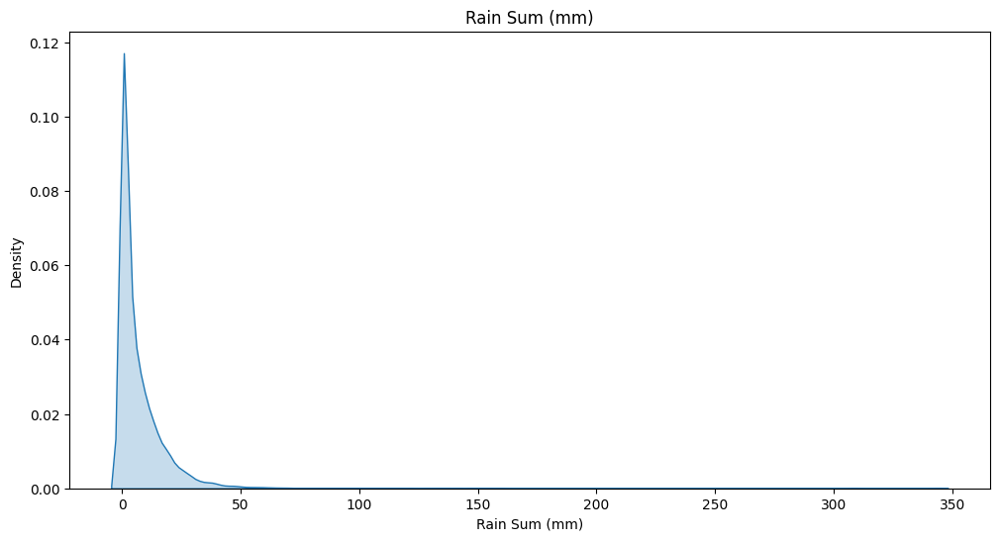

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(dtrain['rain_sum (mm)'], shade=True)
plt.title('Rain Sum (mm)')
plt.xlabel('Rain Sum (mm)')
plt.ylabel('Density')
plt.show()

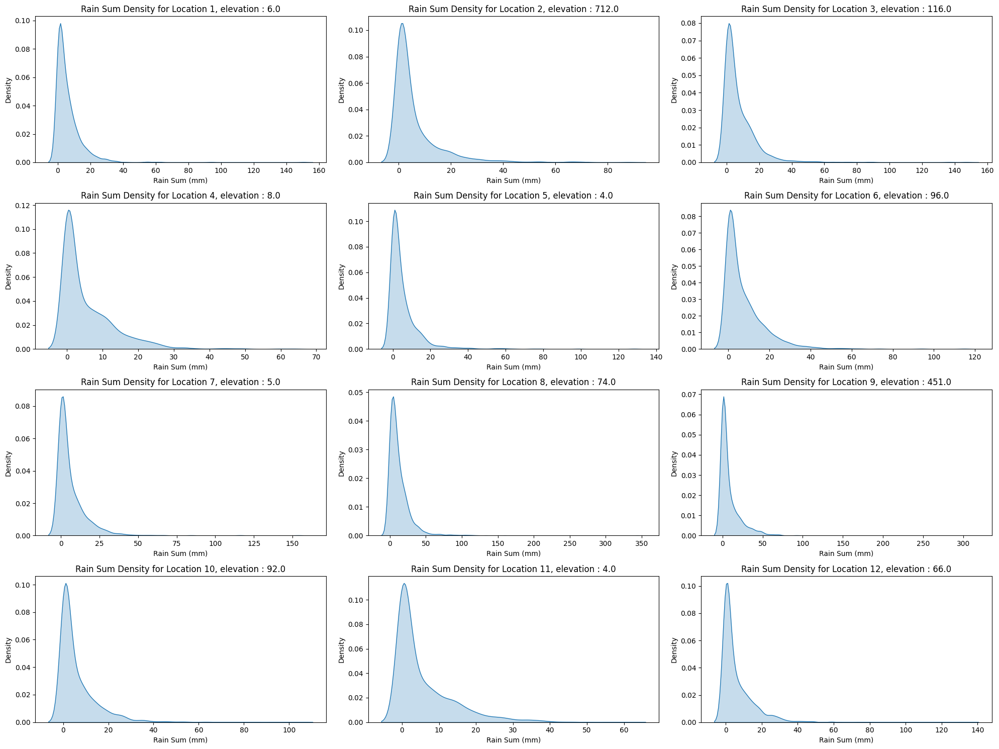

In [ ]:
# Calculate the density of rain_sum for each location
location_density = {}
for location_id in dtrain['location_id'].unique():
    location_data = dtrain[dtrain['location_id'] == location_id]
    location_density[location_id] = location_data['rain_sum (mm)'].values

# Subplots
fig, axes = plt.subplots(4, 3, figsize=(20, 15))
axes = axes.flatten()

# Plot density for each location
for i, location_id in enumerate(location_density):
    ax = axes[i]
    sns.kdeplot(location_density[location_id], shade=True, ax=ax)
    ax.set_title(f'Rain Sum Density for Location {location_id}, elevation : {loc.loc[location_id-1, "elevation"]}')
    ax.set_xlabel("Rain Sum (mm)")
    ax.set_ylabel("Density")

# Remove any unused subplots
for j in range(i + 1, len(axes)):
  fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Secara keseluruhan, distribusi tampak miring ke kanan, yang menunjukkan bahwa sebagian besar curah hujan bernilai kecil dan curah hujan yang lebih tinggi jarang terjadi. Menurut [jurnal](https://ejurnal.undana.ac.id/FISA/article/view/2451#:~:text=Telah%20dilakukan%20analisis%20pola%20dan%20distribusi%20hujan%20berdasarkan,dan%20data%20periode%20curah%20hujan%20selama%20musim%20hujan.), lokasi dengan elevasi lebih tinggi cenderung memiliki curah hujan yang relatif lebih tinggi pula. Namun, dapat dilihat bahwa ada juga lokasi dengan elevasi rendah (lokasi 1, 7) yang memiliki curah hujan cukup tinggi. Hal ini menunjukkan bahwa faktor lain selain elevasi mungkin memengaruhi curah hujan di lokasi-lokasi tersebut.

### Sunshine Duration

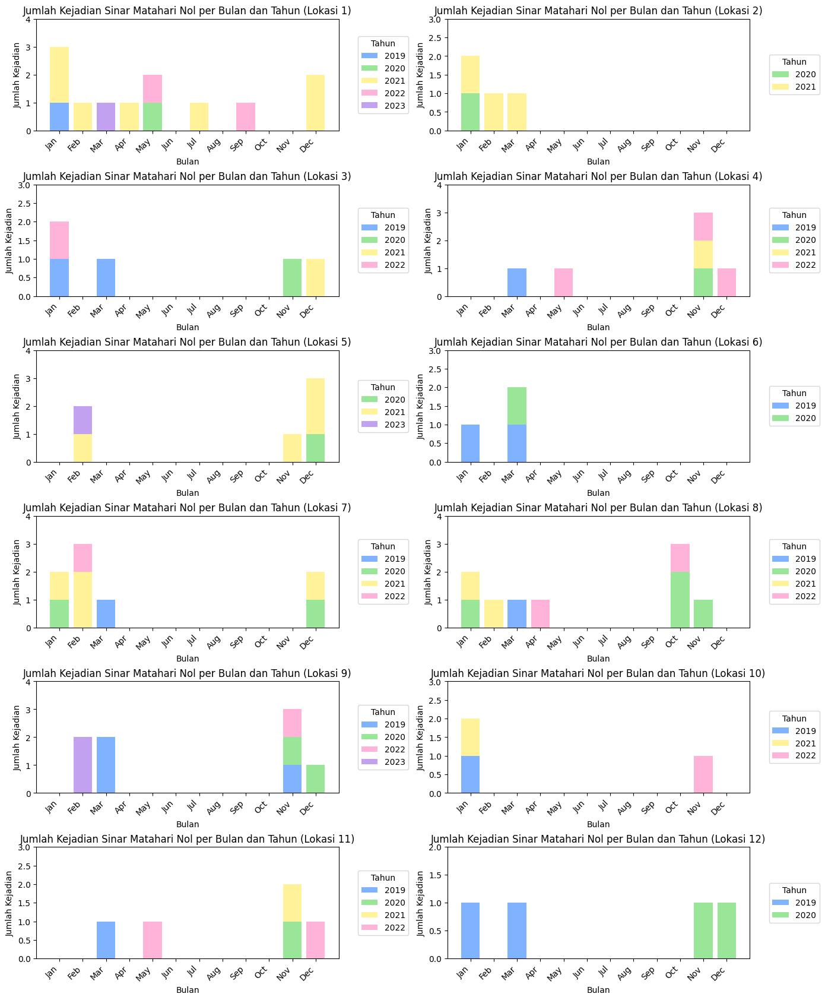

In [ ]:
# Bar Chart Durasi Matahari 0

# Menyaring data untuk durasi sinar matahari = 0
dtrain_filtered = dtrain[dtrain['sunshine_duration (s)'] == 0]

# Membuat semua bulan (1-12) tersedia di setiap kombinasi 'location_id' dan 'year'
monthly_counts = (dtrain_filtered.groupby(['location_id', 'year', 'month'])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=range(1, 13), fill_value=0)  # Pastikan bulan 1-12 selalu ada
)

# Membuat grafik untuk setiap lokasi
num_locations = dtrain_filtered['location_id'].nunique()
# Set ukuran untuk subplots: 2 kolom dan 6 baris
plt.figure(figsize=(14, 18))  # Menyesuaikan ukuran figure agar cukup besar
# Menentukan warna untuk setiap tahun
year_colors = {
    2019: '#80b3ff',  # Light Blue
    2020: '#99e699',  # Light Green
    2021: '#fff299',  # Light Yellow
    2022: '#ffb3d9',  # Light Pink
    2023: '#c2a2f0',  # Light Lavender
    2024: '#99ccff',  # Light Sky Blue
}

# Loop untuk setiap lokasi
for i, location in enumerate(dtrain_filtered['location_id'].unique()):
    ax = plt.subplot(6, 2, i + 1)  # 6 baris, 2 kolom, urutan lokasi i+1

    # Mengambil data untuk lokasi tertentu
    location_data = monthly_counts.loc[location]

    # Membuat stacked bar chart untuk lokasi tersebut
    bottom_values = [0] * 12  # Untuk menumpuk bar chart

    for year in location_data.index:
        # Plot data untuk tahun tertentu, menumpuk bar secara bertahap
        ax.bar(location_data.columns, location_data.loc[year], label=str(year),
               color=year_colors.get(year, 'gray'), bottom=bottom_values)

        # Memperbarui posisi bottom untuk tahun berikutnya
        bottom_values = [bottom + value for bottom, value in zip(bottom_values, location_data.loc[year])]

    # Menambahkan label dan judul
    ax.set_title(f'Jumlah Kejadian Sinar Matahari Nol per Bulan dan Tahun (Lokasi {location})')
    ax.set_xlabel('Bulan')
    ax.set_ylabel('Jumlah Kejadian')

    # Menyesuaikan xticks untuk bulan 1-12
    ax.set_xticks(range(1, 13))  # Mengatur posisi ticks bulan
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45, ha='right')

    # Menyesuaikan sumbu y agar sesuai dengan nilai tertinggi
    ax.set_ylim(0, max(bottom_values) + 1)  # Atur batas sumbu y agar cukup tinggi untuk bar tertinggi

    # Menambahkan legenda di luar subplot
    plt.legend(title='Tahun', bbox_to_anchor=(1.05, 0.5), loc='center left')

# Menata layout dan Menampilkan Plot
plt.tight_layout()
plt.subplots_adjust(bottom=0.1)
plt.show()

Terlihat pola musiman yang jelas hampir di seluruh lokasi, dengan jumlah kejadian sinar matahari nol lebih tinggi pada awal dan akhir tahun, yang mengindikasikan kaitannya dengan musim hujan (atau dingin). Ini mendukung penjelasan pada line chart curah hujan per bulan sebelumnya.

### Relationship Between Elevation and Temperature

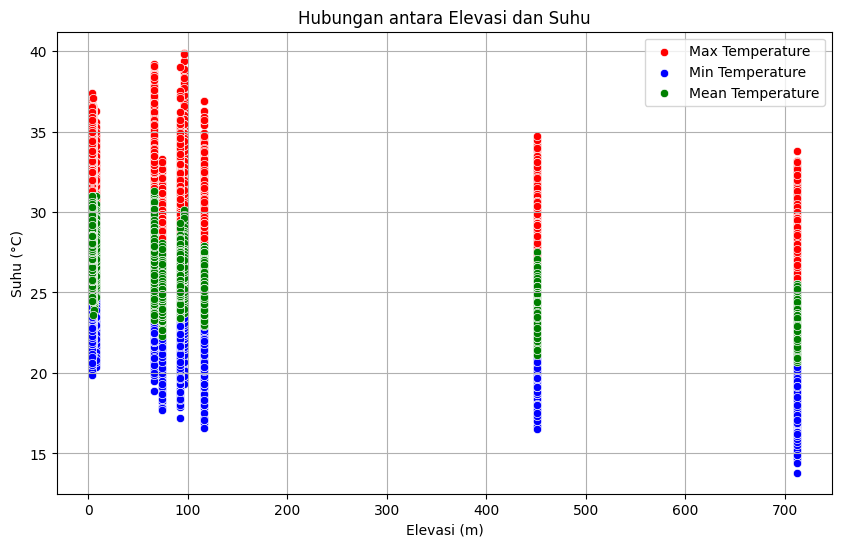

In [ ]:
# Membuat scatter plot untuk suhu maksimum, suhu minimum, dan suhu rata-rata terhadap elevasi
plt.figure(figsize=(10, 6))

# Plot suhu maksimum, minimum, dan rata-rata terhadap elevasi
sns.scatterplot(x=dtrain['elevation'], y=dtrain['temperature_2m_max (°C)'], label='Max Temperature', color='red')
sns.scatterplot(x=dtrain['elevation'], y=dtrain['temperature_2m_min (°C)'], label='Min Temperature', color='blue')
sns.scatterplot(x=dtrain['elevation'], y=dtrain['temperature_2m_mean (°C)'], label='Mean Temperature', color='green')

# Tambahkan label dan judul
plt.title('Hubungan antara Elevasi dan Suhu')
plt.xlabel('Elevasi (m)')
plt.ylabel('Suhu (°C)')
plt.legend()
plt.grid(True)
plt.show()

Umumnya, lokasi yang lebih tinggi akan memiliki suhu lingkungan yang lebih rendah dibandingkan lokasi yang lebih rendah. Berdasarkan plot di atas, benar terdapat tren bahwa suhu minimum di lokasi dengan elevasi lebih tinggi lebih rendah daripada suhu minimum di lokasi dengan elevasi lebih rendah. Begitupun sebaliknya, pada lokasi dengan elevasi lebih rendah, suhu maksimum cenderung lebih tinggi dibandingkan lokasi dengan elevasi lebih tinggi. Pola ini mungkin disebabkan oleh beberapa faktor, termasuk tekanan atmosfer yang lebih rendah pada ketinggian yang lebih tinggi dan ketersediaan radiasi matahari yang lebih sedikit.

### Wind Direction

In [ ]:
# Fungsi untuk mengkategorikan arah angin
def categorize_wind_direction(degree):
    if 337.5 <= degree or degree < 22.5:
        return 'N'
    elif 22.5 <= degree < 67.5:
        return 'NE'
    elif 67.5 <= degree < 112.5:
        return 'E'
    elif 112.5 <= degree < 157.5:
        return 'SE'
    elif 157.5 <= degree < 202.5:
        return 'S'
    elif 202.5 <= degree < 247.5:
        return 'SW'
    elif 247.5 <= degree < 292.5:
        return 'W'
    elif 292.5 <= degree < 337.5:
        return 'NW'

In [ ]:
# Fungsi untuk plot Windrose
def plot_windrose(data, title):
    # Tambahkan kolom kategori arah angin
    data['wind_direction_category'] = data['wind_direction_10m_dominant (°)'].apply(categorize_wind_direction)
    locations = data['location_id'].unique()

    # Ukuran plot
    fig, axes = plt.subplots(4, 3, figsize=(20, 20), subplot_kw={'projection': 'windrose'})
    axes = axes.flatten()  # Mengubah array axes menjadi list untuk iterasi

    # Iterasi setiap lokasi
    for i, location in enumerate(locations[:12]):
        # Filter data untuk lokasi tertentu
        location_data = data[data['location_id'] == location]
        elevation = location_data['elevation'].iloc[0]

        # Ambil kecepatan dan arah angin
        ws = location_data['wind_speed_10m_max (km/h)'].to_numpy()  # Kecepatan angin
        wd = location_data['wind_direction_10m_dominant (°)'].to_numpy()  # Arah angin

        # Tentukan lebar bin dan rentang kecepatan angin
        width = 5
        maxVal = 30  # Nilai maksimal kecepatan angin
        windRange = np.arange(0, maxVal + width, width)  # Rentang kecepatan angin dalam bin

        # WindroseAxes
        ax = axes[i]
        ax.bar(wd, ws, bins=windRange, normed=True, opening=0.85, linewidth=0.5, edgecolor='black')

        # Title and Legend
        ax.set_title(f"Location {location}\nElevation: {elevation} m", fontsize=10)
        ax.set_legend(title="Kecepatan Angin (km/h)", loc='lower right', fontsize=8)

        # Format radius axis ke dalam persen
        fmt = '%.0f%%'
        yticks = mtick.FormatStrFormatter(fmt)
        ax.yaxis.set_major_formatter(yticks)

    # Sembunyikan sisa subplot jika jumlah lokasi < 12
    for j in range(len(locations), 12):
        fig.delaxes(axes[j])

    # Show Plot
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

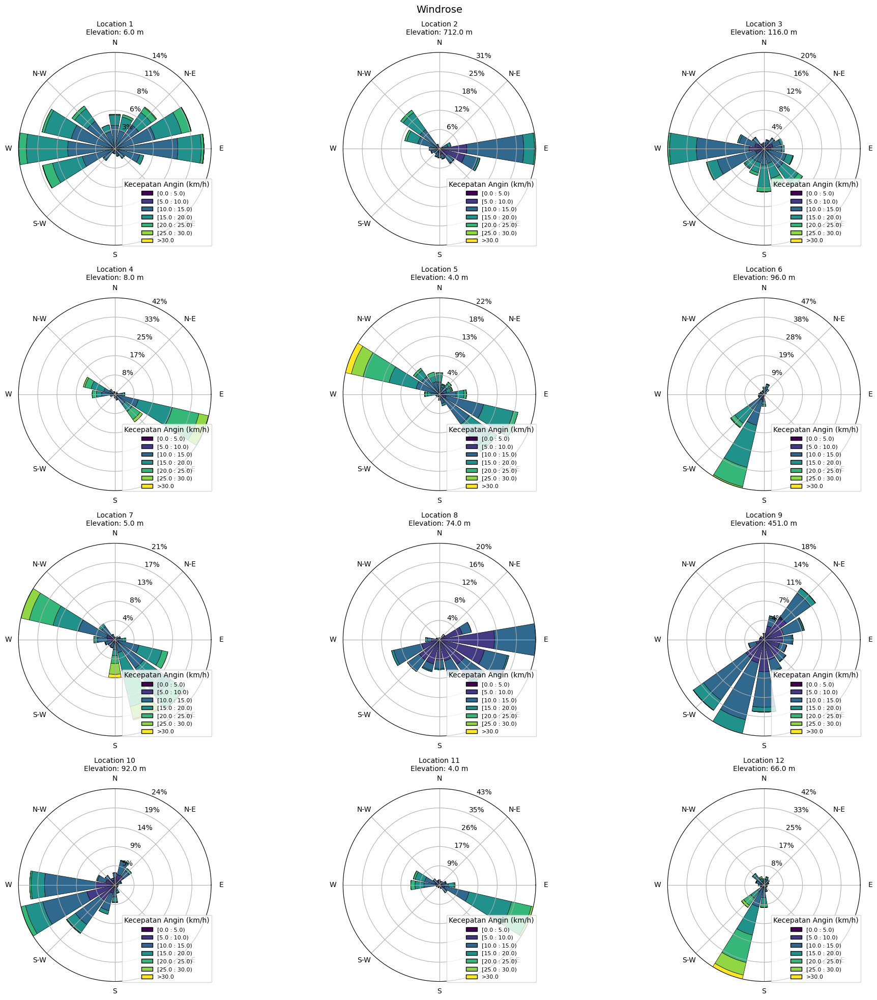

In [ ]:
plot_windrose(dtrain, "Windrose\n")

In [ ]:
# Statistik Wind Speed per Lokasi
wind_stats = dtrain.groupby('location_id')['wind_speed_10m_max (km/h)'].agg(['min', 'max', 'median'])
wind_stats.T

location_id,1,2,3,4,5,6,7,8,9,10,11,12
min,5.9,5.6,5.5,4.8,6.2,4.2,6.2,4.3,4.3,4.9,5.9,5.4
max,27.2,24.6,26.6,30.9,38.0,31.0,37.2,18.4,26.0,28.9,29.7,34.6
median,14.0,11.4,13.1,16.3,14.8,14.8,15.8,9.3,10.3,11.1,14.4,15.6


 Berdasarkan plot windrose di atas, rentang kecepatan angin terlihat relatif serupa di berbagai elevasi. Tidak ada tren kuat yang mengindikasikan bahwa angin di lokasi tinggi selalu lebih cepat dibanding lokasi rendah. Lalu,  beberapa lokasi memiliki distribusi pola angin yang tersebar ke banyak arah, sementara lokasi lainnya menunjukkan pola angin yang terpusat ke satu arah.

In [ ]:
# Membandingkan Windrose untuk bulan-bulan tertentu

# Filter data
# Plot 1: Bulan 11, 12, 1, 2
plot1_data = dtrain[dtrain['month'].isin([11, 12, 1, 2])] # bulan dengan rain_sum cukup tinggi

# Plot 2: Bulan 5, 6, 7, 8
plot2_data = dtrain[dtrain['month'].isin([5, 6, 7, 8])] # bulan dengan rain_sum cukup rendah

# Fungsi untuk plot berdasarkan pilihan dropdown
def plot_based_on_selection(plot_selection):
    if plot_selection == 'Plot 1 (Nov-Feb)':
        plot_windrose(plot1_data, "Windrose for Months 11, 12, 1, 2\n")
    elif plot_selection == 'Plot 2 (May-Aug)':
        plot_windrose(plot2_data, "Windrose for Months 5, 6, 7, 8\n")

# Dropdown untuk memilih plot
dropdown = widgets.Dropdown(
    options=['Plot 1 (Nov-Feb)', 'Plot 2 (May-Aug)'],
    value='Plot 1 (Nov-Feb)',  # Default value
    description='Choose Plot:',
)

# Tampilkan dropdown dan Plot
widgets.interactive(plot_based_on_selection, plot_selection=dropdown)

interactive(children=(Dropdown(description='Choose Plot:', options=('Plot 1 (Nov-Feb)', 'Plot 2 (May-Aug)'), v…

Mengasumsikan `wind direction` atau arah angin yang dimaksud adalah "Dari mana angin bertiup", terlihat pola bahwa pada bulan basah (rain_sum cukup tinggi) angin cenderung bertiup dari arah Barat laut-Barat daya, kecuali untuk beberapa lokasi seperti lokasi 8 dan 9. Sementara itu, pada bulan kering (rain_sum cukup rendah) angin cenderung bertiup dari Timur laut-Tenggara, kecuali untuk beberapa lokasi.   

Pola ini sesuai dengan pola **angin muson**. Secara umum, angin muson adalah fenomena atmosfer yang terjadi karena adanya perbedaan tekanan udara antara daratan dan lautan yang berganti arah setiap setengah tahun/6 bulan. Pada periode muson barat (Oktober–Maret), angin bergerak dari belahan bumi utara menuju selatan, membawa uap air dari lautan menuju daratan di wilayah tropis. Pola ini biasanya menghasilkan musim hujan, ditandai dengan curah hujan yang cukup tinggi.   

Sebaliknya, pada periode muson timur (April–September), arah angin membawa udara kering dari wilayah subtropis menuju tropis. Angin ini menyebabkan musim kemarau di beberapa wilayah tropis.   

Pola angin pada wind rose di atas yang kurang sesuai dengan angin muson menandakan bahwa pada lokasi-lokasi tersebut angin juga dipengaruhi oleh pola angin lokal.

Sumber : [[1]](https://www.researchgate.net/profile/Widhiyanuriyawan-Denny/publication/315408702_Pemetaan_Potensi_Energi_Angin_di_Perairan_Indonesia_Berdasarkan_Data_Satelit_QuikScat_dan_WindSat/links/5921cc43aca27295a8a6401c/Pemetaan-Potensi-Energi-Angin-di-Perairan-Indonesia-Berdasarkan-Data-Satelit-QuikScat-dan-WindSat.pdf) [[2]](https://www.jurnalftijayabaya.ac.id/index.php/TREnD/article/view/179)

### Numeric Feature Correlation

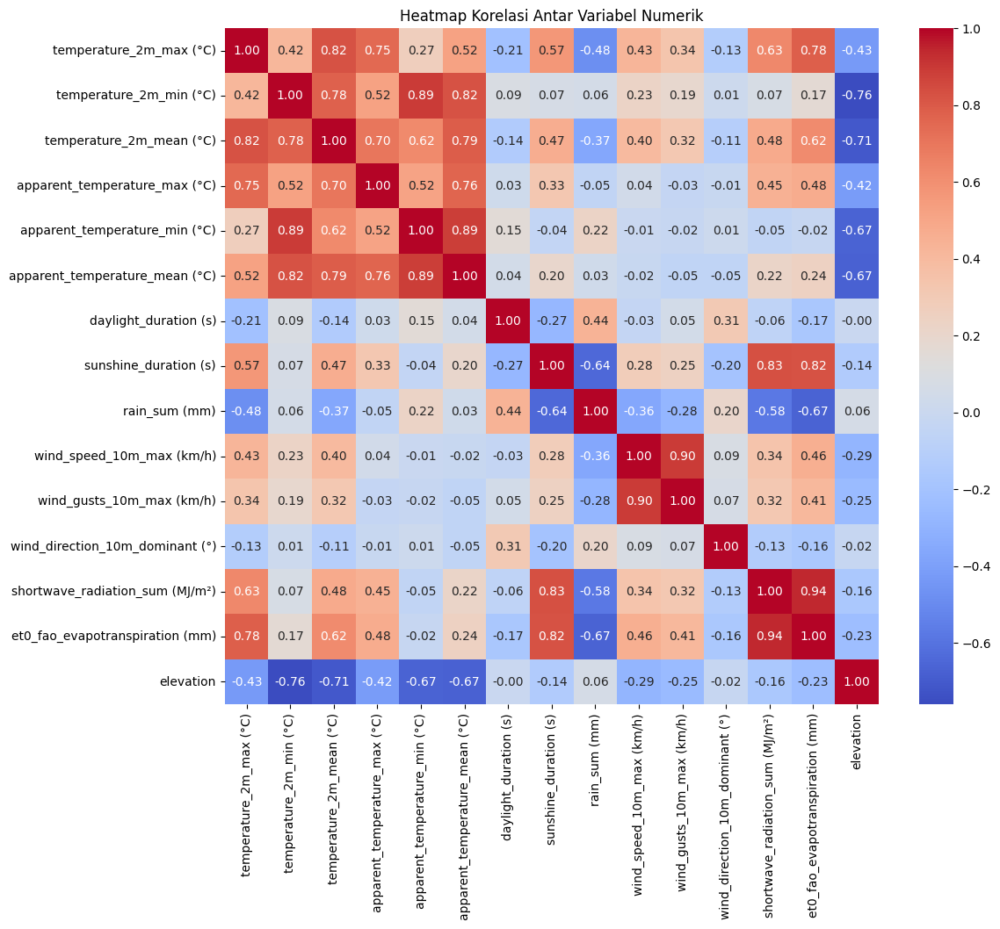

In [ ]:
# Pilih kolom numerik saja
numeric_columns = dtrain.select_dtypes(include='float').columns

# Hitung matriks korelasi
correlation_matrix = dtrain[numeric_columns].corr(method='spearman')

# Plot heatmap korelasi
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)
plt.title('Heatmap Korelasi Antar Variabel Numerik')
plt.show()

- Suhu: Terdapat korelasi kuat (positif) antar variabel suhu, ini mengindikasikan bahwa suhu maksimum, minimum, dan rata-rata cenderung bergerak/berubah bersamaan.
- Radiasi Matahari & Evapotranspirasi: Korelasi positif yang sangat kuat antara radiasi matahari dan evapotranspirasi menandakan bahwa semakin banyak radiasi matahari yang diterima, semakin tinggi pula evapotranspirasi. Hal ini wajar karena radiasi matahari memang terdapat dalam rumus perhitungan et0 (FAO).
- Elevasi & Variabel Lainnya: Terdapat korelasi negatif antara elevasi dan beberapa variabel lainnya, terutama suhu, radiasi matahari, dan evapotranspirasi. Hal ini mengindikasikan bahwa semakin tinggi elevasi, semakin rendah suhu, radiasi matahari, dan evapotranspirasi, seperti yang telah dijelaskan pada plot sebelumnya.
- Durasi Siang : Terdapat korelasi positif cukup kuat antara durasi siang dan suhu, serta durasi siang dan radiasi matahari, menunjukkan bahwa suhu dan radiasi matahari cenderung lebih tinggi ketika durasi siang lebih panjang.
- Curah Hujan : Terdapat korelasi negatif antara curah hujan dengan suhu, `sunshine duration`, radiasi matahari, dan evapotranspirasi menunjukkan bahwa fitu-fitur tersebut cenderung lebih rendah ketika curah hujan lebih tinggi.

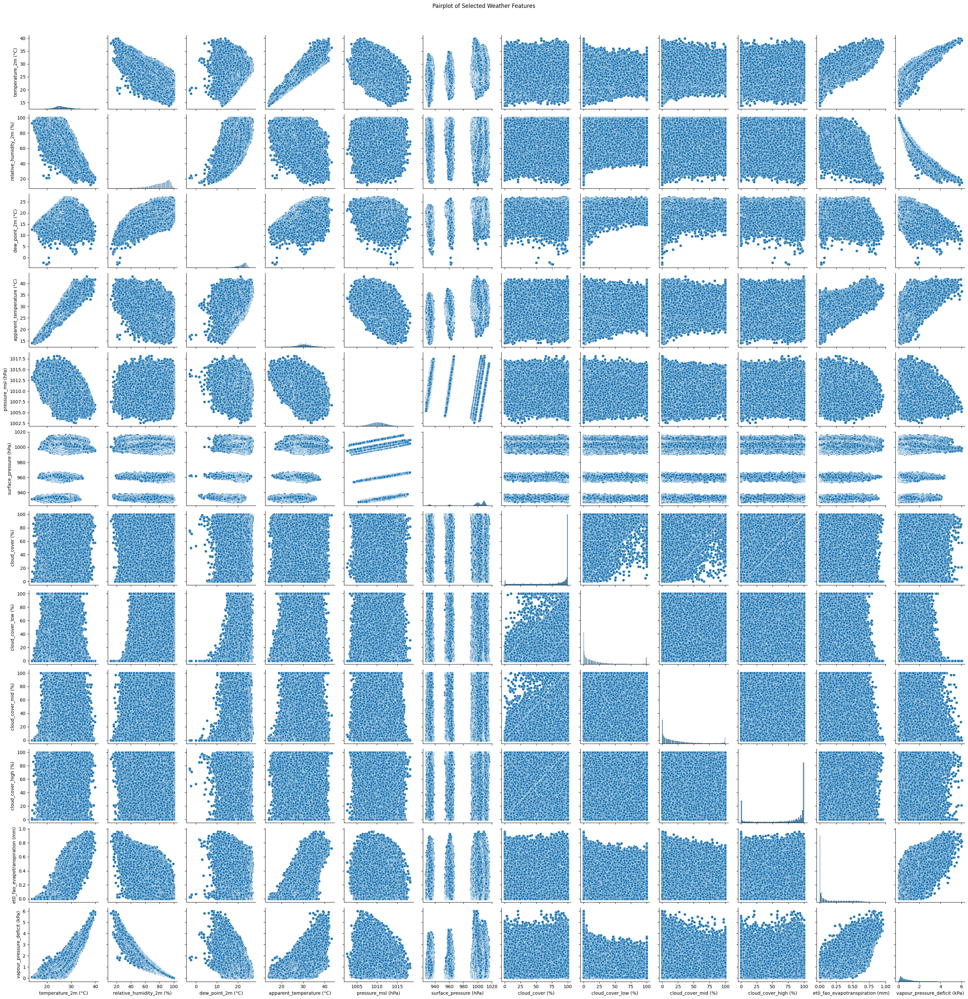

In [ ]:
# Memilih kolom-kolom yang diinginkan untuk pairplot
cols_to_plot = [
    'temperature_2m (°C)',
    'relative_humidity_2m (%)',
    'dew_point_2m (°C)',
    'apparent_temperature (°C)',
    'pressure_msl (hPa)',
    'surface_pressure (hPa)',
    'cloud_cover (%)',
    'cloud_cover_low (%)',
    'cloud_cover_mid (%)',
    'cloud_cover_high (%)',
    'et0_fao_evapotranspiration (mm)',
    'vapour_pressure_deficit (kPa)'
]

# Membuat pairplot dengan kolom-kolom yang dipilih
sns.pairplot(hourly_train[cols_to_plot])

# Menambahkan judul
plt.suptitle('Pairplot of Selected Weather Features', y=1.02)

# Menampilkan plot
plt.show()

### Outlier

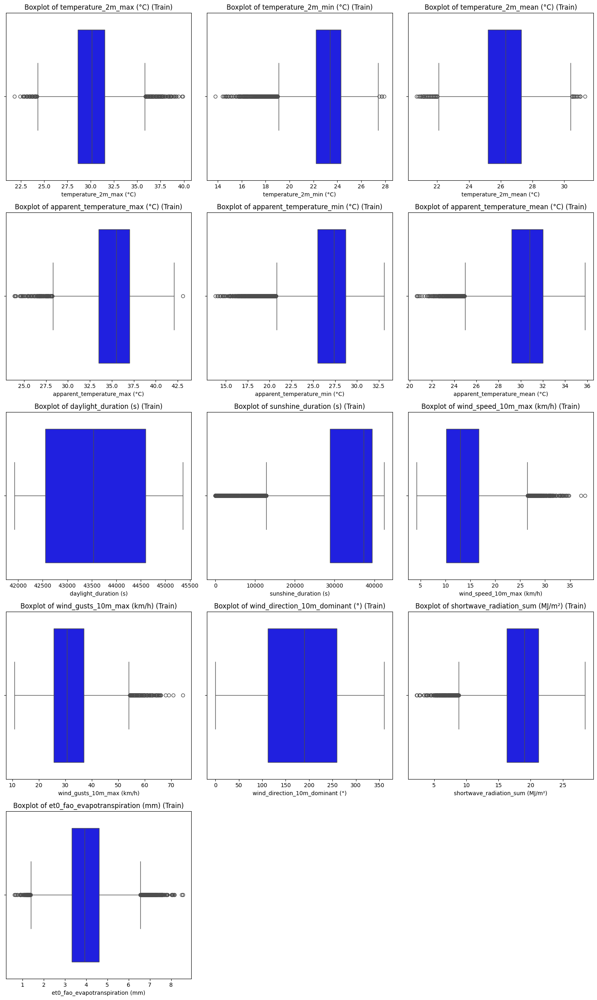

In [ ]:
# Boxplot fitur pada data daily_train
# Pilih kolom numerik yang ada di kedua dataset
numeric_columns = [col for col in daily_train.select_dtypes(include='float').columns if col in daily_test.columns]

# Atur grid untuk visualisasi
num_cols = 3  # Jumlah kolom dalam grid
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols  # Hitung jumlah baris yang dibutuhkan

# Boxplot visualization for train data only
plt.figure(figsize=(15, 5 * num_rows))  # Adjust the figure size for train data

for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_rows, num_cols, i)  # Subplot for each column
    sns.boxplot(data=daily_train, x=column, color='blue')
    plt.title(f'Boxplot of {column} (Train)')
    plt.xlabel(column)

plt.tight_layout()  # Avoid overlap between subplots
plt.show()

Outlier tidak terlalu terlihat/berpengaruh.

### Merge

In [122]:
# Konversi ke satuan MJ/m²
sum_col = [
    'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)', 'terrestrial_radiation_instant (W/m²)']

for col in sum_col:
    new_col_name = col.replace(' (W/m²)', ' (MJ/m²)')  # Mengubah nama kolom
    hourly_train[new_col_name] = (hourly_train[col] * 3600) / 1_000_000

# Hitung sum per hari
sum_col2 = [
    'direct_radiation_instant (MJ/m²)', 'diffuse_radiation_instant (MJ/m²)',
    'direct_normal_irradiance_instant (MJ/m²)', 'terrestrial_radiation_instant (MJ/m²)']

hourly_train['time'] = pd.to_datetime(hourly_train['time'])
hourly_train['date'] = hourly_train['time'].dt.date

hourly_sum = hourly_train.groupby(['location_id', 'date'])[sum_col2].sum()
hourly_sum.reset_index(inplace=True)

In [123]:
# Pengecualian kolom yang dijumlahkan
exclude_columns = [
    'direct_radiation_instant (MJ/m²)','diffuse_radiation_instant (MJ/m²)',
    'direct_normal_irradiance_instant (MJ/m²)','terrestrial_radiation_instant (MJ/m²)',
    'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)', 'terrestrial_radiation_instant (W/m²)',
    'shortwave_radiation_instant (W/m²)'
]

numeric_columns = hourly_train.select_dtypes(include=['float64']).columns
numeric_columns_to_include = [col for col in numeric_columns if col not in exclude_columns]

# Definisikan fungsi agregasi
aggregation_functions = {col: ['mean', 'max', 'min', 'std'] for col in numeric_columns_to_include}

# Agregasi hourly_train menjadi harian
hourly_aggregated = hourly_train.groupby(['location_id', 'date']).agg(aggregation_functions)

# Flatten MultiIndex columns
hourly_aggregated.columns = ['_'.join(col).strip() for col in hourly_aggregated.columns]
hourly_aggregated.reset_index(inplace=True)

In [124]:
# Merge hourly_sum and hourly_aggregated
hourly_agg = pd.merge(hourly_aggregated, hourly_sum, on=['location_id', 'date'], how='left')

daily_train['time'] = pd.to_datetime(daily_train['time'])
hourly_agg['date'] = pd.to_datetime(hourly_agg['date'])

daily_combined = pd.merge(daily_train, hourly_agg,
                          how='left',
                          left_on=['location_id', 'time'],
                          right_on=['location_id', 'date'])

train = pd.merge(daily_combined, loc, how='left', on='location_id')

train = train.drop(columns=['date', # drop kolom redundant
                            'temperature_2m (°C)_mean', 'temperature_2m (°C)_max','temperature_2m (°C)_min',
                            'apparent_temperature (°C)_mean',	'apparent_temperature (°C)_max',	'apparent_temperature (°C)_min',
                            'wind_speed_10m (km/h)_max', 'wind_gusts_10m (km/h)_max'])
train

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),temperature_2m (°C)_std,relative_humidity_2m (%)_mean,relative_humidity_2m (%)_max,relative_humidity_2m (%)_min,relative_humidity_2m (%)_std,dew_point_2m (°C)_mean,dew_point_2m (°C)_max,dew_point_2m (°C)_min,dew_point_2m (°C)_std,apparent_temperature (°C)_std,pressure_msl (hPa)_mean,pressure_msl (hPa)_max,pressure_msl (hPa)_min,pressure_msl (hPa)_std,surface_pressure (hPa)_mean,surface_pressure (hPa)_max,surface_pressure (hPa)_min,surface_pressure (hPa)_std,cloud_cover (%)_mean,cloud_cover (%)_max,cloud_cover (%)_min,cloud_cover (%)_std,cloud_cover_low (%)_mean,cloud_cover_low (%)_max,cloud_cover_low (%)_min,cloud_cover_low (%)_std,cloud_cover_mid (%)_mean,cloud_cover_mid (%)_max,cloud_cover_mid (%)_min,cloud_cover_mid (%)_std,cloud_cover_high (%)_mean,cloud_cover_high (%)_max,cloud_cover_high (%)_min,cloud_cover_high (%)_std,et0_fao_evapotranspiration (mm)_mean,et0_fao_evapotranspiration (mm)_max,et0_fao_evapotranspiration (mm)_min,et0_fao_evapotranspiration (mm)_std,vapour_pressure_deficit (kPa)_mean,vapour_pressure_deficit (kPa)_max,vapour_pressure_deficit (kPa)_min,vapour_pressure_deficit (kPa)_std,wind_speed_10m (km/h)_mean,wind_speed_10m (km/h)_min,wind_speed_10m (km/h)_std,wind_speed_100m (km/h)_mean,wind_speed_100m (km/h)_max,wind_speed_100m (km/h)_min,wind_speed_100m (km/h)_std,wind_direction_10m (°)_mean,wind_direction_10m (°)_max,wind_direction_10m (°)_min,wind_direction_10m (°)_std,wind_direction_100m (°)_mean,wind_direction_100m (°)_max,wind_direction_100m (°)_min,wind_direction_100m (°)_std,wind_gusts_10m (km/h)_mean,wind_gusts_10m (km/h)_min,wind_gusts_10m (km/h)_std,soil_temperature_0_to_7cm (°C)_mean,soil_temperature_0_to_7cm (°C)_max,soil_temperature_0_to_7cm (°C)_min,soil_temperature_0_to_7cm (°C)_std,soil_temperature_7_to_28cm (°C)_mean,soil_temperature_7_to_28cm (°C)_max,soil_temperature_7_to_28cm (°C)_min,soil_temperature_7_to_28cm (°C)_std,soil_temperature_28_to_100cm (°C)_mean,soil_temperature_28_to_100cm (°C)_max,soil_temperature_28_to_100cm (°C)_min,soil_temperature_28_to_100cm (°C)_std,soil_temperature_100_to_255cm (°C)_mean,soil_temperature_100_to_255cm (°C)_max,soil_temperature_100_to_255cm (°C)_min,soil_temperature_100_to_255cm (°C)_std,soil_moisture_0_to_7cm (m³/m³)_mean,soil_moisture_0_to_7cm (m³/m³)_max,soil_moisture_0_to_7cm (m³/m³)_min,soil_moisture_0_to_7cm (m³/m³)_std,soil_moisture_7_to_28cm (m³/m³)_mean,soil_moisture_7_to_28cm (m³/m³)_max,soil_moisture_7_to_28cm (m³/m³)_min,soil_moisture_7_to_28cm (m³/m³)_std,soil_moisture_28_to_100cm (m³/m³)_mean,soil_moisture_28_to_100cm (m³/m³)_max,soil_moisture_28_to_100cm (m³/m³)_min,soil_moisture_28_to_100cm (m³/m³)_std,soil_moisture_100_to_255cm (m³/m³)_mean,soil_moisture_100_to_255cm (m³/m³)_max,soil_moisture_100_to_255cm (m³/m³)_min,soil_moisture_100_to_255cm (m³/m³)_std,direct_radiation_instant (MJ/m²),diffuse_radiation_instant (MJ/m²),direct_normal_irradiance_instant (MJ/m²),terrestrial_radiation_instant (MJ/m²),x,y,elevation
0,loc1_20190101,1,2019-01-01,26.8,24.2,25.4,31.6,27.1,28.8,2019-01-01T05:41,2019-01-01T18:10,44897.80,0.00,9.6,22.7,44.3,258.0,7.40,1.87,0.589384,88.375000,93.0,85.0,2.650882,23.316667,24.8,22.6,0.701344,1.259507,1010.875000,1012.5,1009.2,1.108171,1010.175000,1011.8,1008.5,1.108171,98.833333,100.0,88.0,3.252647,6.916667,42.0,0.0,10.918340,71.375000,100.0,20.0,27.466679,98.166667,100.0,75.0,5.623450,0.078750,0.29,0.02,0.068671,0.375417,0.50,0.22,0.089490,15.433333,8.6,2.947463,24.404167,35.7,12.3,5.365387,258.333333,267.0,246.0,5.873053,256.666667,266.0,246.0,5.197547,33.979167,28.1,4.494536,27.095833,27.8,

In [ ]:
train.columns

Index(['ID', 'location_id', 'time', 'temperature_2m_max (°C)',
       'temperature_2m_min (°C)', 'temperature_2m_mean (°C)',
       'apparent_temperature_max (°C)', 'apparent_temperature_min (°C)',
       'apparent_temperature_mean (°C)', 'sunrise (iso8601)',
       ...
       'soil_moisture_100_to_255cm (m³/m³)_max',
       'soil_moisture_100_to_255cm (m³/m³)_min',
       'soil_moisture_100_to_255cm (m³/m³)_std',
       'direct_radiation_instant (MJ/m²)', 'diffuse_radiation_instant (MJ/m²)',
       'direct_normal_irradiance_instant (MJ/m²)',
       'terrestrial_radiation_instant (MJ/m²)', 'x', 'y', 'elevation'],
      dtype='object', length=118)

In [ ]:
# Mengecek jumlah nilai kosong di setiap kolom
missing_values = train.isnull().sum()

# Menampilkan jumlah nilai kosong untuk semua kolom
print("Jumlah Nilai Kosong di Setiap Kolom:")
print(missing_values[missing_values > 0])  # Hanya menampilkan kolom yang memiliki nilai kosong

# Menampilkan jumlah total nilai kosong di seluruh dataset
total_missing = train.isnull().sum().sum()
print(f"\nTotal Nilai Kosong di Dataset: {total_missing}")

Jumlah Nilai Kosong di Setiap Kolom:
Series([], dtype: int64)

Total Nilai Kosong di Dataset: 0


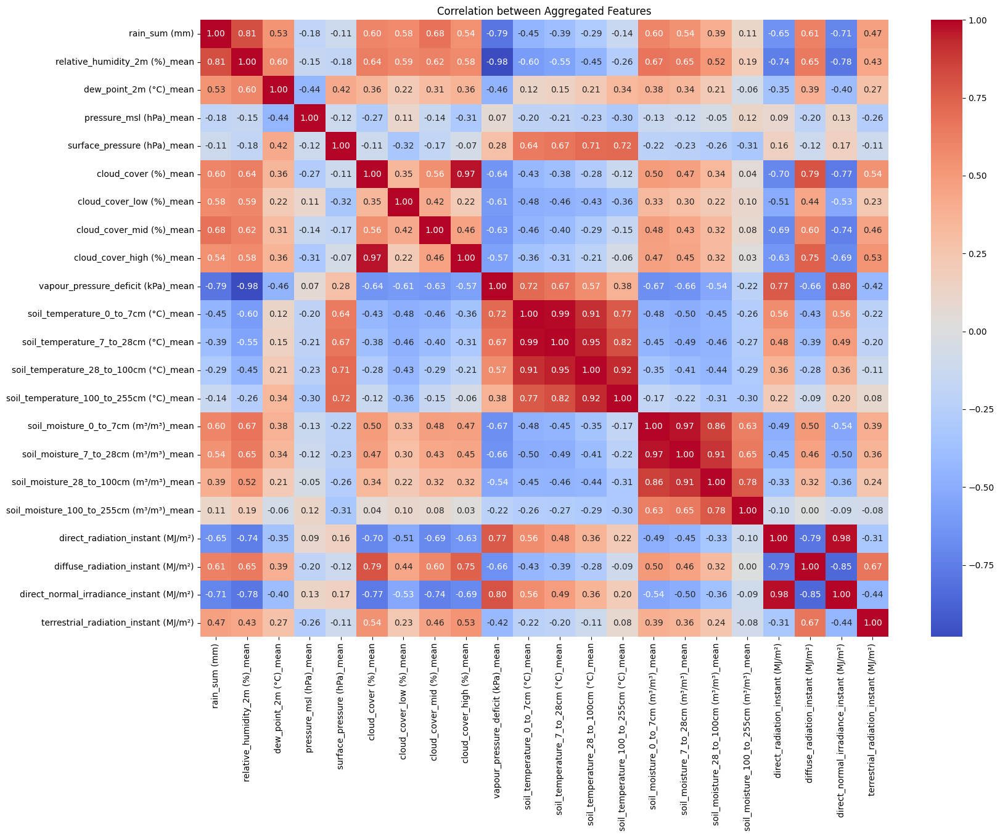

In [ ]:
# Matrix Korelasi rain_sum dengan fitur hasil agregasi
correlation_matrix = train[['rain_sum (mm)', 'relative_humidity_2m (%)_mean',
                             'dew_point_2m (°C)_mean', 'pressure_msl (hPa)_mean', 'surface_pressure (hPa)_mean',
                             'cloud_cover (%)_mean',	'cloud_cover_low (%)_mean', 'cloud_cover_mid (%)_mean',
                             'cloud_cover_high (%)_mean', 'vapour_pressure_deficit (kPa)_mean', 'soil_temperature_0_to_7cm (°C)_mean',
                             'soil_temperature_7_to_28cm (°C)_mean', 'soil_temperature_28_to_100cm (°C)_mean',
                             'soil_temperature_100_to_255cm (°C)_mean', 'soil_moisture_0_to_7cm (m³/m³)_mean',
                             'soil_moisture_7_to_28cm (m³/m³)_mean', 'soil_moisture_28_to_100cm (m³/m³)_mean',
                             'soil_moisture_100_to_255cm (m³/m³)_mean','direct_radiation_instant (MJ/m²)',
                            'diffuse_radiation_instant (MJ/m²)', 'direct_normal_irradiance_instant (MJ/m²)',
                            'terrestrial_radiation_instant (MJ/m²)']].corr(method='spearman')

# Heatmap
plt.figure(figsize=(18, 13))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between Aggregated Features')
plt.show()

**Korelasi antar fitur :**
- `vapour_pressure_deficit (kPa)_mean` dan `relative_humidity_2m (%)_mean`
 **Korelasi negatif yang sangat kuat** (-0.98) menunjukkan bahwa semakin rendah defisit tekanan uap, semakin tinggi kelembapan relatif. Hal ini masuk akal karena defisit tekanan uap adalah ukuran perbedaan antara jumlah uap air yang dapat ditampung udara dan jumlah uap air yang ada saat ini. Ketika kelembapan relatif mendekati 100% (udara jenuh), defisit tekanan uap akan mendekati nol.

- `soil_moisture_7_to_28cm_mean` dan `relative_humidity_2m (%)_mean` (r = 0.65)  
Kelembapan tanah yang tinggi berkaitan erat dengan kelembapan udara di atasnya. Ketika tanah memiliki kandungan air yang tinggi, terjadi proses evaporasi yang menghasilkan uap air di atmosfer, meningkatkan kelembapan relatif.

- Awan pada ketinggian menengah seringkali menunjukkan akumulasi uap air yang cukup untuk membentuk presipitasi. Awan jenis ini sering terlibat dalam proses hujan lebat karena mereka mengandung cukup banyak tetes air untuk bergabung dan jatuh sebagai hujan.

-  `soil_temperature_7_to_28cm_mean` dan `soil_moisture_7_to_28cm_mean` (r = -0.66)  
Ketika suhu tanah meningkat, kandungan air tanah pada lapisan tersebut cenderung menurun karena terjadinya proses penguapan. Suhu yang tinggi menyebabkan air di tanah menguap lebih cepat, sehingga kelembapan tanah juga akan berkurang.

- `cloud_cover_low (%)_mean` dan `relative_humidity_2m (%)_mean` (r = 0.58)  
Kelembapan udara yang tinggi cenderung mendukung pembentukan awan pada lapisan rendah. Ketika udara berada di dekat permukaan jenuh dengan uap air, uap ini akan mengembun membentuk awan rendah seperti stratus atau kabut.


**Korelasi Fitur dengan Target (`rain_sum (mm)`)**
- `relative_humidity_2m (%)_mean` (r = 0.81)  
Semakin tinggi kelembapan relatif udara, semakin banyak hujan yang terjadi. Hal ini masuk akal karena kelembapan relatif yang tinggi menunjukkan bahwa udara sudah hampir jenuh dengan uap air, yang bisa mengarah pada kondensasi dan hujan jika ada faktor lain yang mendukung (seperti pergerakan udara atau kondisi cuaca tertentu). ambil dr docs

- `dew_point_2m (°C)_mean`  (r = 0.53)  
semakin tinggi titik embun (dew point), semakin banyak hujan yang terjadi. Titik embun adalah suhu dimana udara harus didinginkan agar uap air mengembun menjadi cairan. Ketika titik embun tinggi, berarti udara lebih banyak mengandung uap air yang bisa menghasilkan hujan jika ada faktor kondensasi lainnya.

- `cloud_cover_mid (%)_mean` (r = 0.68)   
semakin banyak awan dengan ketinggian menengah (cloud cover mid), semakin tinggi jumlah hujan yang terjadi. Awan menengah (seperti altostratus) sering mengandung lebih banyak uap air yang dapat mengarah pada hujan lebat atau hujan sedang.

- `vapour_pressure_deficit (kPa)_mean` (r = -0.79)   
ketika defisit tekanan uap tinggi (udara lebih kering), curah hujan cenderung lebih rendah. Defisit tekanan uap adalah selisih antara kapasitas udara untuk menahan uap air dan jumlah uap air yang sebenarnya ada di udara. Ketika defisit tekanan uap tinggi, itu menunjukkan bahwa udara lebih kering dan kurang kondusif untuk hujan.

Kelembapan udara, kondisi awan, dan defisit tekanan uap memiliki hubungan yang kuat dengan jumlah curah hujan yang tercatat. Umumnya, semakin banyak uap air yang ada di udara (terlihat dari kelembapan relatif yang tinggi atau titik embun yang tinggi), semakin tinggi kemungkinan terjadinya hujan. Selain itu, keberadaan awan, baik rendah, menengah, atau tinggi, juga memainkan peran penting dalam mengindikasikan potensi hujan. Sebaliknya, defisit tekanan uap yang tinggi biasanya terkait dengan kondisi kering dan rendahnya kemungkinan hujan.

Kami memutuskan untuk menghapus outlier dari data Train.

In [125]:
# Menghapus outlier pada rain sum

if 'rain_sum (mm)' in train.columns:
    # Filter data dengan rain_sum < 150
    train = train[train['rain_sum (mm)'] < 150]

## Test

In [ ]:
daily_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5892 entries, 0 to 5891
Data columns (total 18 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ID                               5892 non-null   object 
 1   location_id                      5892 non-null   int64  
 2   time                             5892 non-null   object 
 3   temperature_2m_max (°C)          5892 non-null   float64
 4   temperature_2m_min (°C)          5892 non-null   float64
 5   temperature_2m_mean (°C)         5892 non-null   float64
 6   apparent_temperature_max (°C)    5892 non-null   float64
 7   apparent_temperature_min (°C)    5892 non-null   float64
 8   apparent_temperature_mean (°C)   5892 non-null   float64
 9   sunrise (iso8601)                5892 non-null   object 
 10  sunset (iso8601)                 5892 non-null   object 
 11  daylight_duration (s)            5892 non-null   float64
 12  sunshine_duration (s

In [ ]:
daily_test.head()

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
0,loc1_20230701,1,2023-07-01,31.0,24.7,27.3,37.1,29.3,32.3,2023-07-01T06:03,2023-07-01T17:49,42371.69,38565.42,13.0,29.5,244.0,16.62,3.53
1,loc1_20230702,1,2023-07-02,30.4,24.8,27.0,36.1,29.7,32.2,2023-07-02T06:03,2023-07-02T17:49,42375.74,32912.11,14.1,32.0,353.0,16.92,3.50
2,loc1_20230703,1,2023-07-03,30.6,24.1,26.9,36.1,28.8,31.8,2023-07-03T06:03,2023-07-03T17:49,42380.19,38607.08,10.2,23.8,292.0,17.47,3.65
3,loc1_20230704,1,2023-07-04,31.0,23.7,27.1,36.3,28.0,32.1,2023-07-04T06:03,2023-07-04T17:50,42385.03,38922.38,13.3,31.0,322.0,19.09,3.95
4,loc1_20230705,1,2023-07-05,32.3,23.8,27.5,37.7,26.9,32.6,2023-07-05T06:03,2023-07-05T17:50,42390.24,38344.69,13.3,31.3,311.0,18.98,3.95


In [ ]:
hourly_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141408 entries, 0 to 141407
Data columns (total 32 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   location_id                              141408 non-null  int64  
 1   time                                     141408 non-null  object 
 2   temperature_2m (°C)                      141408 non-null  float64
 3   relative_humidity_2m (%)                 141408 non-null  float64
 4   dew_point_2m (°C)                        141408 non-null  float64
 5   apparent_temperature (°C)                141408 non-null  float64
 6   pressure_msl (hPa)                       141408 non-null  float64
 7   surface_pressure (hPa)                   141408 non-null  float64
 8   cloud_cover (%)                          141408 non-null  float64
 9   cloud_cover_low (%)                      141408 non-null  float64
 10  cloud_cover_mid (%)             

In [ ]:
hourly_test.head()

,location_id,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),et0_fao_evapotranspiration (mm),vapour_pressure_deficit (kPa),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),soil_temperature_0_to_7cm (°C),soil_temperature_7_to_28cm (°C),soil_temperature_28_to_100cm (°C),soil_temperature_100_to_255cm (°C),soil_moisture_0_to_7cm (m³/m³),soil_moisture_7_to_28cm (m³/m³),soil_moisture_28_to_100cm (m³/m³),soil_moisture_100_to_255cm (m³/m³),shortwave_radiation_instant (W/m²),direct_radiation_instant (W/m²),diffuse_radiation_instant (W/m²),direct_normal_irradiance_instant (W/m²),terrestrial_radiation_instant (W/m²)
0,1,2023-07-01 00:00:00,25.7,88.0,23.5,30.8,1011.2,1010.5,6.0,0.0,3.0,3.0,0.0,0.40,4.6,9.5,219.0,209.0,10.4,27.6,29.2,28.3,28.3,0.305,0.294,0.231,0.326,0.0,0.0,0.0,0.0,0.0
1,1,2023-07-01 01:00:00,25.4,89.0,23.5,30.5,1010.8,1010.1,45.0,0.0,0.0,45.0,0.0,0.36,4.7,10.4,203.0,194.0,9.0,27.3,29.0,28.3,28.3,0.305,0.294,0.231,0.326,0.0,0.0,0.0,0.0,0.0
2,1,2023-07-01 02:00:00,25.2,90.0,23.3,30.2,1010.0,1009.3,87.0,1.0,3.0,87.0,0.0,0.34,4.6,11.0,219.0,203.0,8.6,27.0,28.9,28.3,28.3,0.304,0.294,0.231,0.326,0.0,0.0,0.0,0.0,0.0
3,1,2023-07-01 03:00:00,25.0,89.0,23.1,29.9,1009.8,1009.1,87.0,1.0,4.0,87.0,0.0,0.34,4.9,11.6,234.0,216.0,9.7,26.8,28.8,28.3,28.3,0.304,0.294,0.231,0.326,0.0,0.0,0.0,0.0,0.0
4,1,2023-07-01 04:00:00,24.9,89.0,23.1,29.8,1010.0,1009.3,9.0,1.0,3.0,5.0,0.0,0.33,4.8,10.7,257.0,237.0,8.6,26.6,28.6,28.3,28.3,0.304,0.294,0.231,0.326,0.0,0.0,0.0,0.0,0.0


### Statistic Summary

In [ ]:
daily_test.describe().T

,count,mean,std,min,25%,50%,75%,max
location_id,5892.0,6.500000,3.452346,1.00,3.7500,6.500,9.2500,12.00
temperature_2m_max (°C),5892.0,31.672794,2.526868,23.70,29.9000,31.700,33.4000,38.80
temperature_2m_min (°C),5892.0,22.863764,2.203253,13.70,21.8000,23.400,24.4000,27.60
temperature_2m_mean (°C),5892.0,26.731908,2.023901,19.70,25.5000,27.000,28.1000,31.40
apparent_temperature_max (°C),5892.0,36.321572,4.153023,25.90,34.5000,36.600,38.2000,201.40
apparent_temperature_min (°C),5892.0,26.360149,3.309636,12.30,24.5000,27.100,28.8250,32.60
apparent_temperature_mean (°C),5892.0,30.564596,2.677379,20.50,28.9000,31.200,32.6000,44.70
daylight_duration (s),5892.0,43489.217838,1010.700076,41924.06,42539.5025,43400.035,44372.9600,45358.52
sunshine_duration (s),5890.0,36356.149888,6662.023244,0.00,35792.1275,39283.490,39740.3725,42360.76
wind_speed_10m_max (km/h),5892.0,15.022115,5.036290,4.30,11.2000,14.500,18.4000,35.50


In [ ]:
hourly_test.describe().T

,count,mean,std,min,25%,50%,75%,max
location_id,141408.0,6.500000,3.452065,1.000,3.750,6.500,9.250,12.000
temperature_2m (°C),141408.0,26.736298,3.618797,13.700,24.300,26.300,29.200,38.800
relative_humidity_2m (%),141408.0,75.268853,16.555214,18.000,65.000,79.000,89.000,100.000
dew_point_2m (°C),141408.0,21.492761,2.607763,3.900,19.900,22.000,23.500,27.100
apparent_temperature (°C),141408.0,30.564277,4.191615,12.300,28.100,30.700,33.300,201.400
pressure_msl (hPa),141408.0,1011.017280,2.046538,1003.600,1009.600,1011.000,1012.500,1019.100
surface_pressure (hPa),141408.0,995.668935,22.822709,928.200,998.700,1003.400,1009.200,1016.200
cloud_cover (%),141408.0,68.845094,36.021262,0.000,36.000,89.000,100.000,100.000
cloud_cover_low (%),141408.0,15.799693,24.047353,0.000,1.000,6.000,19.000,100.000
cloud_cover_mid (%),141408.0,14.136279,21.742731,0.000,0.000,5.000,18.000,100.000


### Missing Value and Duplicate

In [ ]:
# Check for duplicate rows and missing values
print("\nNumber of duplicate rows in daily_test:", daily_test.duplicated().sum())
print("Number of duplicate rows in hourly_test:", hourly_test.duplicated().sum())
print("\nMissing values in daily_test:\n", daily_test.isnull().sum())
print("\nMissing values in hourly_test:\n", hourly_test.isnull().sum())


Number of duplicate rows in daily_test: 0
Number of duplicate rows in hourly_test: 0

Missing values in daily_test:
 ID                                 0
location_id                        0
time                               0
temperature_2m_max (°C)            0
temperature_2m_min (°C)            0
temperature_2m_mean (°C)           0
apparent_temperature_max (°C)      0
apparent_temperature_min (°C)      0
apparent_temperature_mean (°C)     0
sunrise (iso8601)                  0
sunset (iso8601)                   0
daylight_duration (s)              0
sunshine_duration (s)              2
wind_speed_10m_max (km/h)          0
wind_gusts_10m_max (km/h)          0
wind_direction_10m_dominant (°)    0
shortwave_radiation_sum (MJ/m²)    2
et0_fao_evapotranspiration (mm)    2
dtype: int64

Missing values in hourly_test:
 location_id                                 0
time                                        0
temperature_2m (°C)                         0
relative_humidity_2m (%)        

Terdapat 2 row missing value pada data daily_test dan 20/21 row missing value pada data hourly_test.

In [ ]:
# Baris dengan missing values pada data Daily
missing_rows = daily_test[daily_test.isnull().any(axis=1)]
missing_rows

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
1469,loc3_20241030,3,2024-10-30,31.3,22.8,25.9,201.4,26.0,37.3,2024-10-30T05:10,2024-10-30T17:33,44547.82,NaN,17.8,38.2,267.0,NaN,NaN
4906,loc10_20241030,10,2024-10-30,33.3,23.6,27.1,180.8,27.2,44.7,2024-10-30T04:57,2024-10-30T17:20,44599.56,NaN,12.3,29.2,256.0,NaN,NaN


Missing Value pada daily_test akan diimputasi secara manual dengan melihat data yang serupa pada waktu sebelumnya.

In [126]:
# Isi nilai manual untuk missing data di lokasi 3 dan 10
daily_test.loc[(daily_test['location_id'] == 3) & (daily_test['et0_fao_evapotranspiration (mm)'].isnull()), 'et0_fao_evapotranspiration (mm)'] = 5.36
daily_test.loc[(daily_test['location_id'] == 3) & (daily_test['sunshine_duration (s)'].isnull()), 'sunshine_duration (s)'] = 40573.28
daily_test.loc[(daily_test['location_id'] == 3) & (daily_test['shortwave_radiation_sum (MJ/m²)'].isnull()), 'shortwave_radiation_sum (MJ/m²)'] = 24.34
daily_test.loc[(daily_test['location_id'] == 10) & (daily_test['et0_fao_evapotranspiration (mm)'].isnull()), 'et0_fao_evapotranspiration (mm)'] = 4.14
daily_test.loc[(daily_test['location_id'] == 10) & (daily_test['sunshine_duration (s)'].isnull()), 'sunshine_duration (s)'] = 35623.18
daily_test.loc[(daily_test['location_id'] == 10) & (daily_test['shortwave_radiation_sum (MJ/m²)'].isnull()), 'shortwave_radiation_sum (MJ/m²)'] = 19.88

# Cek hasil perubahan
missing_rows = daily_test[daily_test.isnull().any(axis=1)]
missing_rows

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)


Untuk data hourly_test, dilakukan imputasi dengan mengisi data berdasarkan rata-rata tiap lokasi.

In [127]:
# Imputasi NaN berdasarkan rata-rata per lokasi
columns_to_impute = [
    'et0_fao_evapotranspiration (mm)', 'shortwave_radiation_instant (W/m²)',
    'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)'
]

# Fungsi untuk imputasi
def impute_with_group_mean(df, column):
    return df.groupby('location_id')[column].transform(lambda x: x.fillna(x.mean()))

# Mengisi NaN untuk setiap kolom yang perlu diimputasi
for col in columns_to_impute:
    hourly_test[col] = impute_with_group_mean(hourly_test, col)

# Cek hasil imputasi
print(hourly_test.isnull().sum())

location_id                                0
time                                       0
temperature_2m (°C)                        0
relative_humidity_2m (%)                   0
dew_point_2m (°C)                          0
apparent_temperature (°C)                  0
pressure_msl (hPa)                         0
surface_pressure (hPa)                     0
cloud_cover (%)                            0
cloud_cover_low (%)                        0
cloud_cover_mid (%)                        0
cloud_cover_high (%)                       0
et0_fao_evapotranspiration (mm)            0
vapour_pressure_deficit (kPa)              0
wind_speed_10m (km/h)                      0
wind_speed_100m (km/h)                     0
wind_direction_10m (°)                     0
wind_direction_100m (°)                    0
wind_gusts_10m (km/h)                      0
soil_temperature_0_to_7cm (°C)             0
soil_temperature_7_to_28cm (°C)            0
soil_temperature_28_to_100cm (°C)          0
soil_tempe

Missing value berhasil diimputasi.

### Outlier

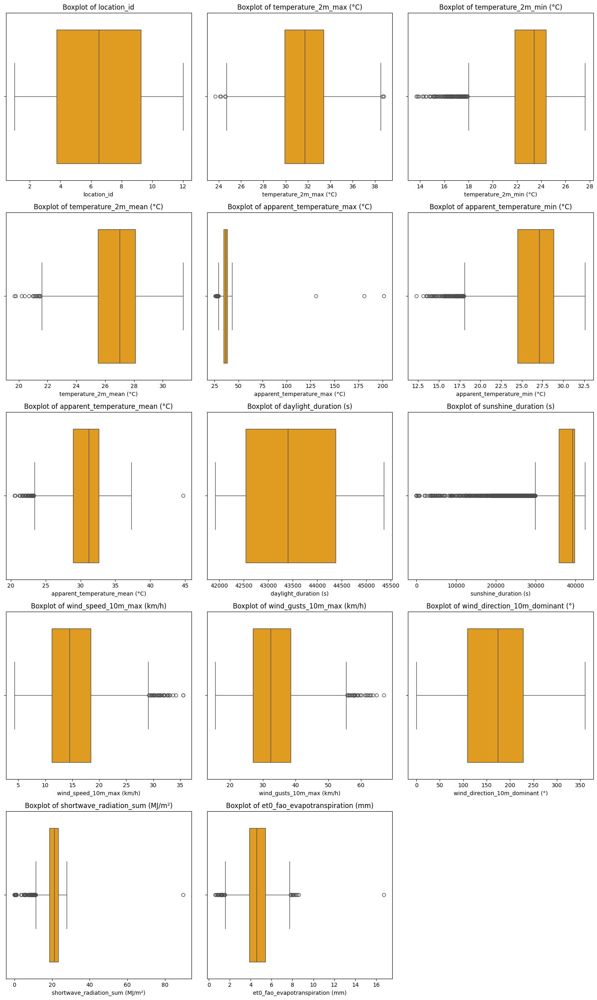

In [ ]:
# Boxplot Daily
# Pilih hanya kolom numerik
numeric_columns = daily_test.select_dtypes(include=['float64', 'int64']).columns

# Tentukan ukuran grid untuk subplot
num_cols = 3  # Jumlah kolom dalam grid
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols  # Hitung jumlah baris

# Plot boxplot untuk setiap kolom numerik
plt.figure(figsize=(15, 5 * num_rows))  # Ukuran gambar menyesuaikan jumlah baris
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=daily_test, x=column, color='orange')
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)

# Mengatur tata letak untuk menghindari overlap
plt.tight_layout()
plt.show()


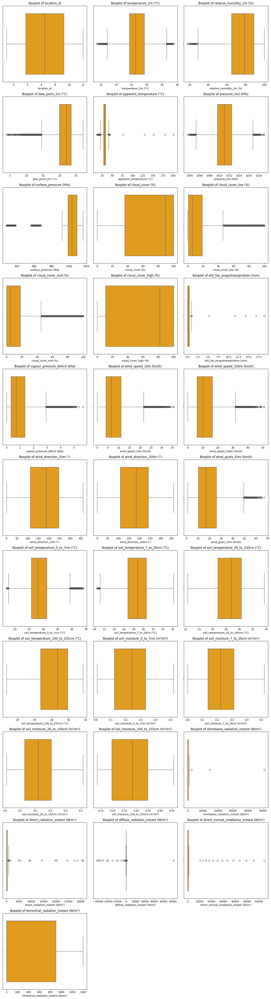

In [ ]:
# Boxplot Hourly
# Pilih hanya kolom numerik
numeric_columns = hourly_test.select_dtypes(include=['float64', 'int64']).columns

# Tentukan ukuran grid untuk subplot
num_cols = 3  # Jumlah kolom dalam grid
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols  # Hitung jumlah baris

# Plot boxplot untuk setiap kolom numerik
plt.figure(figsize=(15, 5 * num_rows))  # Ukuran gambar menyesuaikan jumlah baris
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=hourly_test, x=column, color='orange')
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)

# Mengatur tata letak untuk menghindari overlap
plt.tight_layout()
plt.show()

Berdasarkan boxplot data Daily dan Hourly, terlihat bahwa ada outlier pada beberapa fitur seperti `apparent_temperature_max (°C)`, `shortwave_radiation_sum (MJ/M^2)`, `et0_fao_evapotranspiration (mm)`, dan lainnya.

In [ ]:
# Melihat row dengan outlier
# Kriteria outlier
criteria = (
    (daily_test['apparent_temperature_max (°C)'] > 100) |
    (daily_test['apparent_temperature_mean (°C)'] > 40) |
    (daily_test['shortwave_radiation_sum (MJ/m²)'] > 80) |
    (daily_test['et0_fao_evapotranspiration (mm)'] > 16)
)

# Baris yang memenuhi kriteria
filtered_rows = daily_test[criteria]

# Fungsi untuk mendapatkan baris sebelum dan sesudah
def get_surrounding_rows(df, index):
    start = max(index - 1, 0)
    end = min(index + 2, len(df))  # +2 karena slicing [start:end] eksklusif di akhir
    return df.iloc[start:end]

# Mendapatkan semua baris dengan tambahan sebelum dan sesudah
result = pd.concat([get_surrounding_rows(daily_test, idx) for idx in filtered_rows.index]).drop_duplicates()

# Tampilkan kolom tertentu (optional)
result = result[['location_id', 'time',
                 'apparent_temperature_max (°C)',
                 'apparent_temperature_mean (°C)',
                 'shortwave_radiation_sum (MJ/m²)',
                 'et0_fao_evapotranspiration (mm)']]

# Output hasil
result

,location_id,time,apparent_temperature_max (°C),apparent_temperature_mean (°C),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm)
1468,3,2024-10-29,38.0,31.5,24.34,5.36
1469,3,2024-10-30,201.4,37.3,24.34,5.36
1470,3,2024-10-31,40.3,31.6,20.74,4.32
4904,10,2024-10-28,41.0,32.1,23.70,5.29
4905,10,2024-10-29,130.5,36.0,89.53,16.74
4906,10,2024-10-30,180.8,44.7,19.88,4.14
4907,10,2024-10-31,38.5,31.3,19.88,4.14


Untuk mengatasi outlier pada data test, kami memutuskan untuk mengganti nilainya secara manual dengan melihat data pada hari-hari yang berdekatan.

In [128]:
# 1. Untuk lokasi 10, apparent_temperature_max (°C) > 100 diganti dengan 39.5
daily_test.loc[
    (daily_test['location_id'] == 10) &
    (daily_test['apparent_temperature_max (°C)'] > 100),
    'apparent_temperature_max (°C)'
] = 39.5

# 2. Untuk lokasi 3, apparent_temperature_max (°C) > 100 diganti dengan 39.1
daily_test.loc[
    (daily_test['location_id'] == 3) &
    (daily_test['apparent_temperature_max (°C)'] > 100),
    'apparent_temperature_max (°C)'
] = 39.1

# 3. Untuk lokasi 10, apparent_temperature_mean (°C) > 40 diganti dengan 33.5
daily_test.loc[
    (daily_test['location_id'] == 10) &
    (daily_test['apparent_temperature_mean (°C)'] > 40),
    'apparent_temperature_mean (°C)'
] = 33.5

# 4. Untuk lokasi 10, shortwave_radiation_sum (MJ/m²) > 40 diganti dengan 20.33
daily_test.loc[
    (daily_test['location_id'] == 10) &
    (daily_test['shortwave_radiation_sum (MJ/m²)'] > 40),
    'shortwave_radiation_sum (MJ/m²)'
] = 20.33

# 5. Untuk lokasi 10, et0_fao_evapotranspiration (mm) > 14 diganti dengan 4.43
daily_test.loc[
    (daily_test['location_id'] == 10) &
    (daily_test['et0_fao_evapotranspiration (mm)'] > 14),
    'et0_fao_evapotranspiration (mm)'
] = 4.43

# Tampilkan hasil perubahan
print(daily_test.loc[[1468, 1469, 1470, 4904, 4905, 4906, 4907]])

                  ID  location_id        time  temperature_2m_max (°C)  \
1468   loc3_20241029            3  2024-10-29                     33.3   
1469   loc3_20241030            3  2024-10-30                     31.3   
1470   loc3_20241031            3  2024-10-31                     32.4   
4904  loc10_20241028           10  2024-10-28                     34.3   
4905  loc10_20241029           10  2024-10-29                     33.0   
4906  loc10_20241030           10  2024-10-30                     33.3   
4907  loc10_20241031           10  2024-10-31                     31.3   

      temperature_2m_min (°C)  temperature_2m_mean (°C)  \
1468                     22.7                      27.4   
1469                     22.8                      25.9   
1470                     22.7                      26.4   
4904                     23.3                      27.7   
4905                     23.6                      27.5   
4906                     23.6                      27

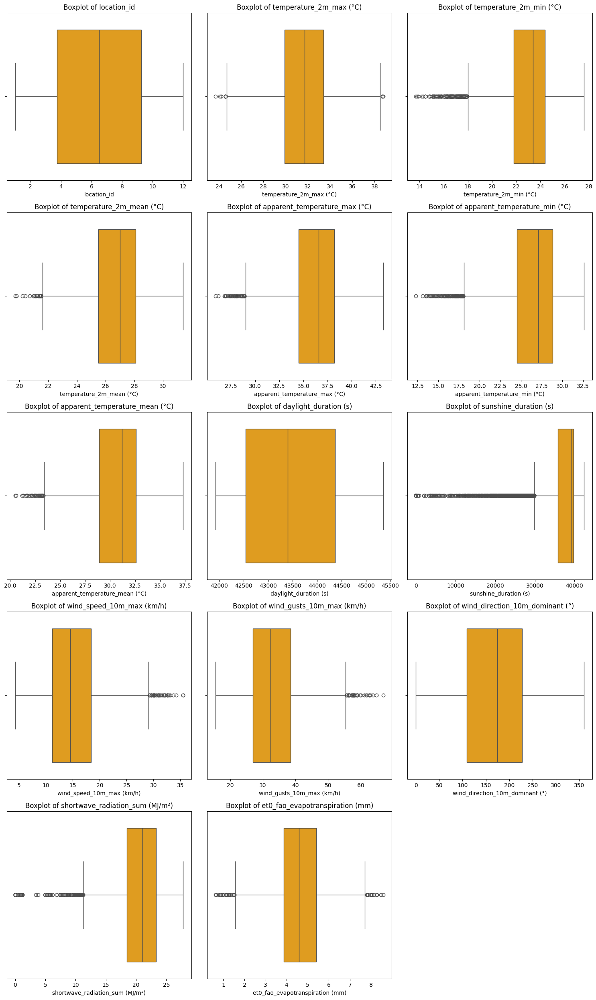

In [ ]:
# Boxplot setelah menangani outlier
# Pilih hanya kolom numerik
numeric_columns = daily_test.select_dtypes(include=['float64', 'int64']).columns

# Tentukan ukuran grid untuk subplot
num_cols = 3  # Jumlah kolom dalam grid
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols  # Hitung jumlah baris

# Plot boxplot untuk setiap kolom numerik
plt.figure(figsize=(15, 5 * num_rows))  # Ukuran gambar menyesuaikan jumlah baris
for i, column in enumerate(numeric_columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.boxplot(data=daily_test, x=column, color='orange')
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)

# Mengatur tata letak untuk menghindari overlap
plt.tight_layout()
plt.show()

### Merge

Fitur Radiasi pada data `hourly` memiliki satuan W/m2, untuk menyatukannya dengan data `daily`, akan diubah terlebih dulu satuannya menjadi MJ/m2 sebelum dihitung sumasinya.

In [129]:
# Konversi ke satuan MJ/m²
sum_col = [
    'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)', 'terrestrial_radiation_instant (W/m²)']

for col in sum_col:
    new_col_name = col.replace(' (W/m²)', ' (MJ/m²)')  # Mengubah nama kolom
    hourly_test[new_col_name] = (hourly_test[col] * 3600) / 1_000_000

# Hitung sum per hari
sum_col2 = [
    'direct_radiation_instant (MJ/m²)', 'diffuse_radiation_instant (MJ/m²)',
    'direct_normal_irradiance_instant (MJ/m²)', 'terrestrial_radiation_instant (MJ/m²)']

hourly_test['time'] = pd.to_datetime(hourly_test['time'])
hourly_test['date'] = hourly_test['time'].dt.date

hourly_sum = hourly_test.groupby(['location_id', 'date'])[sum_col2].sum()
hourly_sum.reset_index(inplace=True)

In [130]:
# Pengecualian kolom yang dijumlahkan
exclude_columns = [
    'direct_radiation_instant (MJ/m²)','diffuse_radiation_instant (MJ/m²)',
    'direct_normal_irradiance_instant (MJ/m²)','terrestrial_radiation_instant (MJ/m²)',
    'direct_radiation_instant (W/m²)', 'diffuse_radiation_instant (W/m²)',
    'direct_normal_irradiance_instant (W/m²)', 'terrestrial_radiation_instant (W/m²)',
    'shortwave_radiation_instant (W/m²)'
]
numeric_columns = hourly_test.select_dtypes(include=['float64']).columns
numeric_columns_to_include = [col for col in numeric_columns if col not in exclude_columns]

# Definisikan fungsi agregasi
aggregation_functions = {col: ['mean', 'max', 'min', 'std'] for col in numeric_columns_to_include}

# Agregasi hourly_test menjadi harian
hourly_aggregated = hourly_test.groupby(['location_id', 'date']).agg(aggregation_functions)

# Flatten MultiIndex columns
hourly_aggregated.columns = ['_'.join(col).strip() for col in hourly_aggregated.columns]
hourly_aggregated.reset_index(inplace=True)

In [131]:
# Merge hourly_sum and hourly_aggregated
hourly_agg = pd.merge(hourly_aggregated, hourly_sum, on=['location_id', 'date'], how='left')

daily_test['time'] = pd.to_datetime(daily_test['time'])
hourly_agg['date'] = pd.to_datetime(hourly_agg['date'])

daily_combined = pd.merge(daily_test, hourly_agg,
                          how='left',
                          left_on=['location_id', 'time'],
                          right_on=['location_id', 'date'])

test = pd.merge(daily_combined, loc, how='left', on='location_id')

test = test.drop(columns=['date', # drop kolom redundant
                            'temperature_2m (°C)_mean', 'temperature_2m (°C)_max','temperature_2m (°C)_min',
                            'apparent_temperature (°C)_mean',	'apparent_temperature (°C)_max',	'apparent_temperature (°C)_min',
                            'wind_speed_10m (km/h)_max', 'wind_gusts_10m (km/h)_max'])
test

,ID,location_id,time,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),sunrise (iso8601),sunset (iso8601),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),temperature_2m (°C)_std,relative_humidity_2m (%)_mean,relative_humidity_2m (%)_max,relative_humidity_2m (%)_min,relative_humidity_2m (%)_std,dew_point_2m (°C)_mean,dew_point_2m (°C)_max,dew_point_2m (°C)_min,dew_point_2m (°C)_std,apparent_temperature (°C)_std,pressure_msl (hPa)_mean,pressure_msl (hPa)_max,pressure_msl (hPa)_min,pressure_msl (hPa)_std,surface_pressure (hPa)_mean,surface_pressure (hPa)_max,surface_pressure (hPa)_min,surface_pressure (hPa)_std,cloud_cover (%)_mean,cloud_cover (%)_max,cloud_cover (%)_min,cloud_cover (%)_std,cloud_cover_low (%)_mean,cloud_cover_low (%)_max,cloud_cover_low (%)_min,cloud_cover_low (%)_std,cloud_cover_mid (%)_mean,cloud_cover_mid (%)_max,cloud_cover_mid (%)_min,cloud_cover_mid (%)_std,cloud_cover_high (%)_mean,cloud_cover_high (%)_max,cloud_cover_high (%)_min,cloud_cover_high (%)_std,et0_fao_evapotranspiration (mm)_mean,et0_fao_evapotranspiration (mm)_max,et0_fao_evapotranspiration (mm)_min,et0_fao_evapotranspiration (mm)_std,vapour_pressure_deficit (kPa)_mean,vapour_pressure_deficit (kPa)_max,vapour_pressure_deficit (kPa)_min,vapour_pressure_deficit (kPa)_std,wind_speed_10m (km/h)_mean,wind_speed_10m (km/h)_min,wind_speed_10m (km/h)_std,wind_speed_100m (km/h)_mean,wind_speed_100m (km/h)_max,wind_speed_100m (km/h)_min,wind_speed_100m (km/h)_std,wind_direction_10m (°)_mean,wind_direction_10m (°)_max,wind_direction_10m (°)_min,wind_direction_10m (°)_std,wind_direction_100m (°)_mean,wind_direction_100m (°)_max,wind_direction_100m (°)_min,wind_direction_100m (°)_std,wind_gusts_10m (km/h)_mean,wind_gusts_10m (km/h)_min,wind_gusts_10m (km/h)_std,soil_temperature_0_to_7cm (°C)_mean,soil_temperature_0_to_7cm (°C)_max,soil_temperature_0_to_7cm (°C)_min,soil_temperature_0_to_7cm (°C)_std,soil_temperature_7_to_28cm (°C)_mean,soil_temperature_7_to_28cm (°C)_max,soil_temperature_7_to_28cm (°C)_min,soil_temperature_7_to_28cm (°C)_std,soil_temperature_28_to_100cm (°C)_mean,soil_temperature_28_to_100cm (°C)_max,soil_temperature_28_to_100cm (°C)_min,soil_temperature_28_to_100cm (°C)_std,soil_temperature_100_to_255cm (°C)_mean,soil_temperature_100_to_255cm (°C)_max,soil_temperature_100_to_255cm (°C)_min,soil_temperature_100_to_255cm (°C)_std,soil_moisture_0_to_7cm (m³/m³)_mean,soil_moisture_0_to_7cm (m³/m³)_max,soil_moisture_0_to_7cm (m³/m³)_min,soil_moisture_0_to_7cm (m³/m³)_std,soil_moisture_7_to_28cm (m³/m³)_mean,soil_moisture_7_to_28cm (m³/m³)_max,soil_moisture_7_to_28cm (m³/m³)_min,soil_moisture_7_to_28cm (m³/m³)_std,soil_moisture_28_to_100cm (m³/m³)_mean,soil_moisture_28_to_100cm (m³/m³)_max,soil_moisture_28_to_100cm (m³/m³)_min,soil_moisture_28_to_100cm (m³/m³)_std,soil_moisture_100_to_255cm (m³/m³)_mean,soil_moisture_100_to_255cm (m³/m³)_max,soil_moisture_100_to_255cm (m³/m³)_min,soil_moisture_100_to_255cm (m³/m³)_std,direct_radiation_instant (MJ/m²),diffuse_radiation_instant (MJ/m²),direct_normal_irradiance_instant (MJ/m²),terrestrial_radiation_instant (MJ/m²),x,y,elevation
0,loc1_20230701,1,2023-07-01,31.0,24.7,27.3,37.1,29.3,32.3,2023-07-01T06:03,2023-07-01T17:49,42371.69,38565.42,13.0,29.5,244.0,16.62,3.53,2.157830,80.250000,90.0,64.0,9.152096,23.487500,24.0,23.0,0.259284,2.228273,1010.820833,1012.8,1008.9,1.160202,1010.120833,1012.1,1008.2,1.160202,55.750000,100.0,6.0,33.564021,6.666667,27.0,0.0,7.636677,20.416667,66.0,0.0,22.329385,44.000000,99.0,0.0,35.889928,0.147083,0.55,0.00,0.193828,0.764167,1.63,0.30,0.458200,6.412500,4.1,2.438159,10.412500,16.5,5.1,3.060309,238.416667,342.0,109.0,61.027376,234.500000,337.0,120.0,57.890451,15.612500,8.6,6.462152,29.025000,32.4,26.3,2.032401,28.9

In [ ]:
# Mengecek jumlah nilai kosong di setiap kolom
missing_values = test.isnull().sum()

# Menampilkan jumlah nilai kosong untuk semua kolom
print("Jumlah Nilai Kosong di Setiap Kolom:")
print(missing_values[missing_values > 0])  # Hanya menampilkan kolom yang memiliki nilai kosong

# Menampilkan jumlah total nilai kosong di seluruh dataset
total_missing = test.isnull().sum().sum()
print(f"\nTotal Nilai Kosong di Dataset: {total_missing}")

Jumlah Nilai Kosong di Setiap Kolom:
Series([], dtype: int64)

Total Nilai Kosong di Dataset: 0


# Feature Engineering

In [132]:
def get_season(month):
    if month in [12, 1, 2]:
        return 'rainy'
    elif month in [3, 4, 5]:
        return 'transitional_1'
    elif month in [6, 7, 8]:
        return 'dry'
    elif month in [9, 10, 11]:
        return 'transitional_2'

def categorize_wind_speed(speed):
    if speed < 10:
        return 'low'
    elif 10 <= speed < 20:
        return 'moderate'
    elif 20 <= speed < 30:
        return 'high'
    else:
        return 'storm'

# Fungsi untuk mengkategorikan temperatur mean
def categorize_temperature_mean(temp):
    if temp < 15:
        return 'cold'
    elif 15 <= temp < 30:
        return 'moderate'
    else:
        return 'hot'


def feature_engineering(df):
    # Mengonversi kolom 'time' menjadi datetime
    df['time'] = pd.to_datetime(df['time'])

    # Ekstrak fitur dari waktu
    df['day'] = df['time'].dt.day
    df['month'] = df['time'].dt.month
    df['year'] = df['time'].dt.year
    df['day_of_year'] = df['time'].dt.dayofyear
    df['week_of_year'] = df['time'].dt.isocalendar().week
    df['day_of_week'] = df['time'].dt.dayofweek
    df['is_weekend'] = df['day_of_week'].apply(lambda x: 1 if x >= 5 else 0)

    # Temperatur
    df['temperature_range'] = df['temperature_2m_max (°C)'] - df['temperature_2m_min (°C)']
    df['daily_temperature_range'] = df['temperature_2m_max (°C)'] - df['temperature_2m_min (°C)']
    df['temperature_gradient'] = df['temperature_2m_mean (°C)'].diff().fillna(0)
    df['temp_pressure_humidity_interaction'] = (
        df['temperature_2m_mean (°C)'] *
        df['relative_humidity_2m (%)_mean'] /
        df['pressure_msl (hPa)_mean']
    )
    df['temp_humidity_interaction'] = df['temperature_2m_mean (°C)'] * df['relative_humidity_2m (%)_mean']
    df['temp_elevation_interaction'] = df['temperature_2m_mean (°C)'] / df['elevation']

    # Sunshine dan Radiasi
    df['sunshine_ratio'] = df['sunshine_duration (s)'] / df['daylight_duration (s)']
    df['radiation_daylight_interaction'] = df['shortwave_radiation_sum (MJ/m²)'] / df['daylight_duration (s)']
    df['radiation_gradient'] = df['shortwave_radiation_sum (MJ/m²)'].diff().fillna(0)

    # Elevasi dan Interaksi
    df['elevation_group'] = pd.cut(df['elevation'], bins=[0, 100, 500, 1000, 3000], labels=['low', 'medium', 'high', 'very_high'])

    # Angin
    df['wind_speed_range'] = df['wind_speed_10m_max (km/h)'] - df['wind_speed_10m (km/h)_min']
    df['wind_speed_gradient'] = df['wind_speed_10m (km/h)_mean'].diff().fillna(0)
    df['wind_pressure_ratio'] = df['wind_speed_10m (km/h)_mean'] / df['pressure_msl (hPa)_mean']

    # Geografi
    df['abs_latitude'] = df['x'].abs()
    df['latitude_longitude_interaction'] = df['x'] * df['y']
    df['distance_from_equator'] = df['x'].apply(lambda lat: np.sqrt(lat**2))

    # Elevasi Berdasarkan Kelompok
    df['elevation_mean_by_group'] = df.groupby('elevation_group')['elevation'].transform('mean')  # Rata-rata elevasi per grup

    # Cloud dan Kelembapan
    df['heavy_cloud_indicator'] = df['cloud_cover (%)_mean'] * df['vapour_pressure_deficit (kPa)_mean']
    df['season'] = df['month'].apply(get_season)

    # Wind Speed and Direction (Features with Transformation)
    df['wind_speed_max_min_difference'] = df['wind_speed_10m_max (km/h)'] - df['wind_speed_10m (km/h)_min']
    df['wind_direction_diff'] = df['wind_direction_10m_dominant (°)'] - df['wind_direction_10m (°)_mean']

    # Latitude-Longitude Interaction Features
    df['latitude_longitude_interaction'] = df['x'] * df['y']

    df.rename(columns={'apparent_temperature (°C)_max': 'apparent_temperature_max (°C)'}, inplace=True)

    # Fitur Temporal
    df['sin_day_of_year'] = np.sin(2 * np.pi * df['day_of_year'] / 365.25)
    df['cos_day_of_year'] = np.cos(2 * np.pi * df['day_of_year'] / 365.25)

    # Fitur Atmosferik
    df['dewpoint_deficit'] = df['temperature_2m_mean (°C)'] - df['dew_point_2m (°C)_mean']
    df['humidity_pressure_ratio'] = df['relative_humidity_2m (%)_mean'] / df['pressure_msl (hPa)_mean']

    # Fitur Awan
    df['cloud_variability'] = df['cloud_cover (%)_max'] - df['cloud_cover (%)_min']
    df['high_cloud_to_total_ratio'] = df['cloud_cover_high (%)_mean'] / (df['cloud_cover (%)_mean'] + 1e-5)

    # Fitur Tanah
    df['soil_moisture_ratio'] = df['soil_moisture_0_to_7cm (m³/m³)_mean'] / (df['soil_moisture_100_to_255cm (m³/m³)_mean'] + 1e-5)
    df['soil_moisture_variability'] = df['soil_moisture_0_to_7cm (m³/m³)_max'] - df['soil_moisture_0_to_7cm (m³/m³)_min']

    # Fitur Angin
    df['storm_indicator'] = ((df['wind_gusts_10m_max (km/h)'] > 30) & (df['pressure_msl (hPa)_mean'] < 1000)).astype(int)
    df['wind_energy_potential'] = 0.5 * (df['wind_speed_10m (km/h)_mean'] ** 3)

    # Fitur Radiasi
    df['sunshine_to_radiation_ratio'] = df['sunshine_duration (s)'] / (df['shortwave_radiation_sum (MJ/m²)'] + 1e-5)

    # Fitur Interaksi
    df['humidity_radiation_interaction'] = df['relative_humidity_2m (%)_mean'] * df['shortwave_radiation_sum (MJ/m²)']
    df['wind_pressure_interaction'] = df['wind_speed_10m (km/h)_mean'] * df['pressure_msl (hPa)_mean']

    df['wind_speed_category'] = df['wind_speed_10m (km/h)_mean'].apply(categorize_wind_speed)

    # Kategori temperatur mean
    df['temperature_category_mean'] = df['temperature_2m_mean (°C)'].apply(categorize_temperature_mean)

    # Mengubah tipe data
    categorical_features = ['elevation_group', 'season', 'wind_speed_category', 'temperature_category_mean', 'is_weekend']
    for feature in categorical_features:
        df[feature] = df[feature].astype('category')
    df['week_of_year'] = df['week_of_year'].astype('int32')

    df['temp_humidity_interaction_squared'] = df['temp_humidity_interaction'] ** 2
    df['wind_pressure_interaction_squared'] = df['wind_pressure_interaction'] ** 2
    df['radiation_sunshine_interaction'] = df['shortwave_radiation_sum (MJ/m²)'] * df['sunshine_duration (s)']
    df['log_dewpoint_deficit'] = np.log1p(df['dewpoint_deficit'])
    df['soil_temperature_difference'] = df['soil_temperature_0_to_7cm (°C)_mean'] - df['soil_temperature_28_to_100cm (°C)_mean']
    df['wind_direction_radians'] = np.radians(df['wind_direction_10m_dominant (°)'])
    df['extreme_temp'] = (df['temperature_2m_max (°C)'] > 35).astype(int)
    df['high_humidity'] = (df['relative_humidity_2m (%)_max'] > 90).astype(int)
    df['low_pressure'] = (df['pressure_msl (hPa)_min'] < 1000).astype(int)

    columns_to_drop = [
      'ID',
      'location_id',
      'time',
      'sunrise (iso8601)',
      'sunset (iso8601)',
      'x',
      'y',
      'daily_temperature_range'
    ]

    # Drop kolom dari train
    df = df.drop(columns=columns_to_drop)

    return df


train = feature_engineering(train)
test = feature_engineering(test)

In [ ]:
train

,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),daylight_duration (s),sunshine_duration (s),rain_sum (mm),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),temperature_2m (°C)_std,relative_humidity_2m (%)_mean,relative_humidity_2m (%)_max,relative_humidity_2m (%)_min,relative_humidity_2m (%)_std,dew_point_2m (°C)_mean,dew_point_2m (°C)_max,dew_point_2m (°C)_min,dew_point_2m (°C)_std,apparent_temperature (°C)_std,pressure_msl (hPa)_mean,pressure_msl (hPa)_max,pressure_msl (hPa)_min,pressure_msl (hPa)_std,surface_pressure (hPa)_mean,surface_pressure (hPa)_max,surface_pressure (hPa)_min,surface_pressure (hPa)_std,cloud_cover (%)_mean,cloud_cover (%)_max,cloud_cover (%)_min,cloud_cover (%)_std,cloud_cover_low (%)_mean,cloud_cover_low (%)_max,cloud_cover_low (%)_min,cloud_cover_low (%)_std,cloud_cover_mid (%)_mean,cloud_cover_mid (%)_max,cloud_cover_mid (%)_min,cloud_cover_mid (%)_std,cloud_cover_high (%)_mean,cloud_cover_high (%)_max,cloud_cover_high (%)_min,cloud_cover_high (%)_std,et0_fao_evapotranspiration (mm)_mean,et0_fao_evapotranspiration (mm)_max,et0_fao_evapotranspiration (mm)_min,et0_fao_evapotranspiration (mm)_std,vapour_pressure_deficit (kPa)_mean,vapour_pressure_deficit (kPa)_max,vapour_pressure_deficit (kPa)_min,vapour_pressure_deficit (kPa)_std,wind_speed_10m (km/h)_mean,wind_speed_10m (km/h)_min,wind_speed_10m (km/h)_std,wind_speed_100m (km/h)_mean,wind_speed_100m (km/h)_max,wind_speed_100m (km/h)_min,wind_speed_100m (km/h)_std,wind_direction_10m (°)_mean,wind_direction_10m (°)_max,wind_direction_10m (°)_min,wind_direction_10m (°)_std,wind_direction_100m (°)_mean,wind_direction_100m (°)_max,wind_direction_100m (°)_min,wind_direction_100m (°)_std,wind_gusts_10m (km/h)_mean,wind_gusts_10m (km/h)_min,wind_gusts_10m (km/h)_std,soil_temperature_0_to_7cm (°C)_mean,soil_temperature_0_to_7cm (°C)_max,soil_temperature_0_to_7cm (°C)_min,soil_temperature_0_to_7cm (°C)_std,soil_temperature_7_to_28cm (°C)_mean,soil_temperature_7_to_28cm (°C)_max,soil_temperature_7_to_28cm (°C)_min,soil_temperature_7_to_28cm (°C)_std,soil_temperature_28_to_100cm (°C)_mean,soil_temperature_28_to_100cm (°C)_max,soil_temperature_28_to_100cm (°C)_min,soil_temperature_28_to_100cm (°C)_std,soil_temperature_100_to_255cm (°C)_mean,soil_temperature_100_to_255cm (°C)_max,soil_temperature_100_to_255cm (°C)_min,soil_temperature_100_to_255cm (°C)_std,soil_moisture_0_to_7cm (m³/m³)_mean,soil_moisture_0_to_7cm (m³/m³)_max,soil_moisture_0_to_7cm (m³/m³)_min,soil_moisture_0_to_7cm (m³/m³)_std,soil_moisture_7_to_28cm (m³/m³)_mean,soil_moisture_7_to_28cm (m³/m³)_max,soil_moisture_7_to_28cm (m³/m³)_min,soil_moisture_7_to_28cm (m³/m³)_std,soil_moisture_28_to_100cm (m³/m³)_mean,soil_moisture_28_to_100cm (m³/m³)_max,soil_moisture_28_to_100cm (m³/m³)_min,soil_moisture_28_to_100cm (m³/m³)_std,soil_moisture_100_to_255cm (m³/m³)_mean,soil_moisture_100_to_255cm (m³/m³)_max,soil_moisture_100_to_255cm (m³/m³)_min,soil_moisture_100_to_255cm (m³/m³)_std,direct_radiation_instant (MJ/m²),diffuse_radiation_instant (MJ/m²),direct_normal_irradiance_instant (MJ/m²),terrestrial_radiation_instant (MJ/m²),elevation,day,month,year,day_of_year,week_of_year,day_of_week,is_weekend,temperature_range,temperature_gradient,temp_pressure_humidity_interaction,temp_humidity_interaction,temp_elevation_interaction,sunshine_ratio,radiation_daylight_interaction,radiation_gradient,elevation_group,wind_speed_range,wind_speed_gradient,wind_pressure_ratio,abs_latitude,latitude_longitude_interaction,distance_from_equator,elevation_mean_by_group,heavy_cloud_indicator,season,wind_speed_max_min_difference,wind_direction_diff,sin_day_of_year,cos_day_of_year,dewpoint_deficit,humidity_pressure_ratio,cloud_variability,high_cloud_to_total_ratio,soil_moisture_ratio,soil_moisture_variability,storm_indica

In [ ]:
test

,temperature_2m_max (°C),temperature_2m_min (°C),temperature_2m_mean (°C),apparent_temperature_max (°C),apparent_temperature_min (°C),apparent_temperature_mean (°C),daylight_duration (s),sunshine_duration (s),wind_speed_10m_max (km/h),wind_gusts_10m_max (km/h),wind_direction_10m_dominant (°),shortwave_radiation_sum (MJ/m²),et0_fao_evapotranspiration (mm),temperature_2m (°C)_std,relative_humidity_2m (%)_mean,relative_humidity_2m (%)_max,relative_humidity_2m (%)_min,relative_humidity_2m (%)_std,dew_point_2m (°C)_mean,dew_point_2m (°C)_max,dew_point_2m (°C)_min,dew_point_2m (°C)_std,apparent_temperature (°C)_std,pressure_msl (hPa)_mean,pressure_msl (hPa)_max,pressure_msl (hPa)_min,pressure_msl (hPa)_std,surface_pressure (hPa)_mean,surface_pressure (hPa)_max,surface_pressure (hPa)_min,surface_pressure (hPa)_std,cloud_cover (%)_mean,cloud_cover (%)_max,cloud_cover (%)_min,cloud_cover (%)_std,cloud_cover_low (%)_mean,cloud_cover_low (%)_max,cloud_cover_low (%)_min,cloud_cover_low (%)_std,cloud_cover_mid (%)_mean,cloud_cover_mid (%)_max,cloud_cover_mid (%)_min,cloud_cover_mid (%)_std,cloud_cover_high (%)_mean,cloud_cover_high (%)_max,cloud_cover_high (%)_min,cloud_cover_high (%)_std,et0_fao_evapotranspiration (mm)_mean,et0_fao_evapotranspiration (mm)_max,et0_fao_evapotranspiration (mm)_min,et0_fao_evapotranspiration (mm)_std,vapour_pressure_deficit (kPa)_mean,vapour_pressure_deficit (kPa)_max,vapour_pressure_deficit (kPa)_min,vapour_pressure_deficit (kPa)_std,wind_speed_10m (km/h)_mean,wind_speed_10m (km/h)_min,wind_speed_10m (km/h)_std,wind_speed_100m (km/h)_mean,wind_speed_100m (km/h)_max,wind_speed_100m (km/h)_min,wind_speed_100m (km/h)_std,wind_direction_10m (°)_mean,wind_direction_10m (°)_max,wind_direction_10m (°)_min,wind_direction_10m (°)_std,wind_direction_100m (°)_mean,wind_direction_100m (°)_max,wind_direction_100m (°)_min,wind_direction_100m (°)_std,wind_gusts_10m (km/h)_mean,wind_gusts_10m (km/h)_min,wind_gusts_10m (km/h)_std,soil_temperature_0_to_7cm (°C)_mean,soil_temperature_0_to_7cm (°C)_max,soil_temperature_0_to_7cm (°C)_min,soil_temperature_0_to_7cm (°C)_std,soil_temperature_7_to_28cm (°C)_mean,soil_temperature_7_to_28cm (°C)_max,soil_temperature_7_to_28cm (°C)_min,soil_temperature_7_to_28cm (°C)_std,soil_temperature_28_to_100cm (°C)_mean,soil_temperature_28_to_100cm (°C)_max,soil_temperature_28_to_100cm (°C)_min,soil_temperature_28_to_100cm (°C)_std,soil_temperature_100_to_255cm (°C)_mean,soil_temperature_100_to_255cm (°C)_max,soil_temperature_100_to_255cm (°C)_min,soil_temperature_100_to_255cm (°C)_std,soil_moisture_0_to_7cm (m³/m³)_mean,soil_moisture_0_to_7cm (m³/m³)_max,soil_moisture_0_to_7cm (m³/m³)_min,soil_moisture_0_to_7cm (m³/m³)_std,soil_moisture_7_to_28cm (m³/m³)_mean,soil_moisture_7_to_28cm (m³/m³)_max,soil_moisture_7_to_28cm (m³/m³)_min,soil_moisture_7_to_28cm (m³/m³)_std,soil_moisture_28_to_100cm (m³/m³)_mean,soil_moisture_28_to_100cm (m³/m³)_max,soil_moisture_28_to_100cm (m³/m³)_min,soil_moisture_28_to_100cm (m³/m³)_std,soil_moisture_100_to_255cm (m³/m³)_mean,soil_moisture_100_to_255cm (m³/m³)_max,soil_moisture_100_to_255cm (m³/m³)_min,soil_moisture_100_to_255cm (m³/m³)_std,direct_radiation_instant (MJ/m²),diffuse_radiation_instant (MJ/m²),direct_normal_irradiance_instant (MJ/m²),terrestrial_radiation_instant (MJ/m²),elevation,day,month,year,day_of_year,week_of_year,day_of_week,is_weekend,temperature_range,temperature_gradient,temp_pressure_humidity_interaction,temp_humidity_interaction,temp_elevation_interaction,sunshine_ratio,radiation_daylight_interaction,radiation_gradient,elevation_group,wind_speed_range,wind_speed_gradient,wind_pressure_ratio,abs_latitude,latitude_longitude_interaction,distance_from_equator,elevation_mean_by_group,heavy_cloud_indicator,season,wind_speed_max_min_difference,wind_direction_diff,sin_day_of_year,cos_day_of_year,dewpoint_deficit,humidity_pressure_ratio,cloud_variability,high_cloud_to_total_ratio,soil_moisture_ratio,soil_moisture_variability,storm_indicator,wind_energ

# Modelling

## Feature Selection

### Mutual Information

In [133]:
# Step 1: Transformasi log pada target
train['log_rain_sum'] = np.log1p(train['rain_sum (mm)'])  # log(1 + y)
y_train = train['log_rain_sum']

# Step 2: Pisahkan fitur numerik dan kategorik
numerical_features = train.select_dtypes(include=['number']).drop(columns=['rain_sum (mm)', 'log_rain_sum'])
categorical_features = train.select_dtypes(exclude=['number']).columns.tolist()

# Menampilkan semua fitur sebelum seleksi
all_features = numerical_features.columns.tolist() + categorical_features
print("Fitur Sebelum Seleksi:")
print(all_features)
print(f"Jumlah Fitur Sebelum Seleksi: {len(all_features)}\n")

# Step 3: Hitung Mutual Information untuk fitur numerik
mi_scores = mutual_info_regression(numerical_features, y_train, random_state=SEED)
mi_scores = pd.Series(mi_scores, index=numerical_features.columns).sort_values(ascending=False)

# Step 4: Tampilkan skor Mutual Information
print("Mutual Information Scores:")
print(mi_scores)

# Step 5: Pilih fitur numerik dengan skor MI di atas threshold
threshold = 0.01  # Atur threshold sesuai kebutuhan
selected_numerical_features = mi_scores[mi_scores > threshold].index.tolist()

# Gabungkan fitur numerik terpilih dengan fitur kategorik
final_selected_features = selected_numerical_features + categorical_features

# Step 6: Dataset Train dan Test dengan fitur terpilih
X_train_selected = train[final_selected_features]
X_test_selected = test[final_selected_features]

# Menampilkan semua fitur setelah seleksi
print("\nFitur Setelah Seleksi:")
print(final_selected_features)
print(f"Jumlah Fitur Setelah Seleksi: {len(final_selected_features)}\n")

Fitur Sebelum Seleksi:
['temperature_2m_max (°C)', 'temperature_2m_min (°C)', 'temperature_2m_mean (°C)', 'apparent_temperature_max (°C)', 'apparent_temperature_min (°C)', 'apparent_temperature_mean (°C)', 'daylight_duration (s)', 'sunshine_duration (s)', 'wind_speed_10m_max (km/h)', 'wind_gusts_10m_max (km/h)', 'wind_direction_10m_dominant (°)', 'shortwave_radiation_sum (MJ/m²)', 'et0_fao_evapotranspiration (mm)', 'temperature_2m (°C)_std', 'relative_humidity_2m (%)_mean', 'relative_humidity_2m (%)_max', 'relative_humidity_2m (%)_min', 'relative_humidity_2m (%)_std', 'dew_point_2m (°C)_mean', 'dew_point_2m (°C)_max', 'dew_point_2m (°C)_min', 'dew_point_2m (°C)_std', 'apparent_temperature (°C)_std', 'pressure_msl (hPa)_mean', 'pressure_msl (hPa)_max', 'pressure_msl (hPa)_min', 'pressure_msl (hPa)_std', 'surface_pressure (hPa)_mean', 'surface_pressure (hPa)_max', 'surface_pressure (hPa)_min', 'surface_pressure (hPa)_std', 'cloud_cover (%)_mean', 'cloud_cover (%)_max', 'cloud_cover (%)_m

### Handle Multicollinearity

In [134]:
# Step 1: Pilih hanya fitur numerik
numerical_features = X_train_selected.select_dtypes(include=['number'])

# Step 2: Hitung matriks korelasi
correlation_matrix = numerical_features.corr().abs()

# Step 3: Identifikasi pasangan fitur dengan korelasi di atas 0.95
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))
high_correlation_pairs = [
    (column, index, upper_triangle.loc[index, column])
    for column in upper_triangle.columns
    for index in upper_triangle.index
    if upper_triangle.loc[index, column] > 0.95
]

# Konversi pasangan korelasi tinggi ke DataFrame
high_correlation_df = pd.DataFrame(high_correlation_pairs, columns=['Feature 1', 'Feature 2', 'Correlation'])

# Tampilkan DataFrame pasangan korelasi tinggi
print("High Correlation Pairs (> 0.95):")
print(high_correlation_df)

# Step 4: Drop salah satu fitur dari setiap pasangan berdasarkan MI
features_to_drop = set()
for col1, col2, _ in high_correlation_pairs:
    if col1 in mi_scores and col2 in mi_scores:
        # Drop fitur dengan skor MI lebih rendah
        if mi_scores[col1] < mi_scores[col2]:
            features_to_drop.add(col1)
        else:
            features_to_drop.add(col2)

# Hapus fitur yang dipilih untuk di-drop
X_train_selected_final = X_train_selected.drop(columns=features_to_drop)
X_test_selected_final = X_test_selected.drop(columns=features_to_drop)

# Tampilkan fitur yang di-drop dan fitur tersisa
print("\nFeatures to Drop (Multicollinearity > 0.95):")
print(pd.DataFrame(list(features_to_drop), columns=['Dropped Features']))

print("\nRemaining Features After Multicollinearity Analysis:")
print(pd.DataFrame(X_train_selected_final.columns.tolist(), columns=['Remaining Features']))

High Correlation Pairs (> 0.95):
                      Feature 1                      Feature 2  Correlation
0       humidity_pressure_ratio  relative_humidity_2m (%)_mean     0.999908
1          log_dewpoint_deficit  relative_humidity_2m (%)_mean     0.988557
2          log_dewpoint_deficit        humidity_pressure_ratio     0.988572
3              dewpoint_deficit  relative_humidity_2m (%)_mean     0.995219
4              dewpoint_deficit        humidity_pressure_ratio     0.995090
..                          ...                            ...          ...
101  surface_pressure (hPa)_max    surface_pressure (hPa)_mean     0.999908
102  surface_pressure (hPa)_min                      elevation     0.998255
103  surface_pressure (hPa)_min    surface_pressure (hPa)_mean     0.999798
104  surface_pressure (hPa)_min     surface_pressure (hPa)_max     0.999589
105     pressure_msl (hPa)_mean         pressure_msl (hPa)_max     0.980030

[106 rows x 3 columns]

Features to Drop (Multicolline

## Model Selection

In [135]:
# Data Preparation
X_train = X_train_selected_final.copy()  # Selected features
X_test = X_test_selected_final.copy()  # Test set features

# Encoding Categoric Variable
# Identify categorical columns
categorical_cols = X_train.select_dtypes(include=['category', 'object']).columns

# Perform one-hot encoding
X_train = pd.get_dummies(X_train, columns=categorical_cols, drop_first=True)
X_test = pd.get_dummies(X_test, columns=categorical_cols, drop_first=True)

# Split train data into train and validation sets
X_train_split, X_valid_split, y_train_split, y_valid_split = train_test_split(
    X_train, y_train, test_size=0.2, random_state=SEED
)

In [136]:
# Pipelines untuk model
pipelines = {
    'RandomForest': Pipeline([
        ('model', RandomForestRegressor(random_state=SEED))
    ]),
    'GradientBoosting': Pipeline([
        ('model', GradientBoostingRegressor(random_state=SEED))
    ]),
    'XGBoost': Pipeline([
        ('model', xgb.XGBRegressor(random_state=SEED))
    ]),
    'LightGBM': Pipeline([
        ('model', lgb.LGBMRegressor(random_state=SEED))
    ]),
    'KNN': Pipeline([
        ('model', KNeighborsRegressor())
    ]),
    'DecisionTree': Pipeline([
        ('model', DecisionTreeRegressor(random_state=SEED))
    ]),
    'CatBoost': Pipeline([
        ('model', cb.CatBoostRegressor(random_state=SEED, verbose=100))
    ]),
    'ExtraTrees': Pipeline([
        ('model', ExtraTreesRegressor(random_state=SEED))
    ])
}

# Fungsi untuk evaluasi model
def evaluate_model(model, X_train, y_train, X_val, y_val):
    model.fit(X_train, y_train)

    # Prediksi pada validation set
    y_pred = model.predict(X_val)
    y_pred = np.expm1(y_pred)  # Transformasi balik dari log scale

    mse = mean_squared_error(np.expm1(y_val), y_pred)
    rmse = np.sqrt(mse)
    mae = mean_squared_error(np.expm1(y_val), y_pred)

    return mse, rmse, mae, y_pred

# Evaluasi setiap model dan tampilkan metriknya
for name, model in pipelines.items():
    print(f"Evaluating {name}...")
    mse, rmse, mae, y_pred = evaluate_model(model, X_train_split, y_train_split, X_valid_split, y_valid_split)
    print(f"  MSE: {mse:.4f}")
    print(f"  RMSE: {rmse:.4f}")
    print(f"  MAE: {mae:.4f}")
    print()


Evaluating RandomForest...
  MSE: 26.4462
  RMSE: 5.1426
  MAE: 26.4462

Evaluating GradientBoosting...
  MSE: 29.9983
  RMSE: 5.4771
  MAE: 29.9983

Evaluating XGBoost...
  MSE: 25.1408
  RMSE: 5.0141
  MAE: 25.1408

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037248 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 17831
[LightGBM] [Info] Number of data points in the train set: 15758, number of used features: 99
[LightGBM] [Info] Start training from score 1.433722
  MSE: 25.5286
  RMSE: 5.0526
  MAE: 25.5286

Evaluating KNN...
  MSE: 109.1175
  RMSE: 10.4459
  MAE: 109.1175

Evaluating DecisionTree...
  MSE: 63.8181
  RMSE: 7.9886
  MAE: 63.8181

Evaluating CatBoost...
Learning rate set to 0.063297
0:	learn: 1.0738301	total: 87.2ms	remaining: 1m 27s
100:	learn: 0.3689015	total: 3.99s	remaining:

Kami memutuskan untuk memilih model **Catboost** karena memiliki MSE paling kecil di antara semua model

## Final Model

In [148]:
final_model = cb.CatBoostRegressor(iterations = 1500, loss_function = 'RMSE', depth = 6,
                                   learning_rate = 0.05, l2_leaf_reg = 10, bagging_temperature = 0.8,
                                   random_strength = 0.7, od_type = 'Iter', early_stopping_rounds=50,
                                   random_state=SEED, verbose=100)
final_model.fit(X_train_split, y_train_split)

# Predict
y_valid_pred_log = final_model.predict(X_valid_split)
y_valid_pred = np.expm1(y_valid_pred_log)  # Transform back from log scale
y_valid_pred = np.maximum(0, y_valid_pred)  # Ensure no negative values

# Calculate MSE, RMSE, and R² for validation set
mse = mean_squared_error(np.expm1(y_valid_split), y_valid_pred)  # Mean Squared Error
rmse = np.sqrt(mse)  # Root Mean Squared Error
r2 = r2_score(np.expm1(y_valid_split), y_valid_pred)  # R² Score

# Print results
print(f"Validation MSE: {mse:.4f}")
print(f"Validation RMSE: {rmse:.4f}")
print(f"Validation R²: {r2:.4f}")

0:	learn: 1.0866643	total: 73.2ms	remaining: 1m 49s
100:	learn: 0.3798032	total: 7.25s	remaining: 1m 40s
200:	learn: 0.3500507	total: 11.8s	remaining: 1m 16s
300:	learn: 0.3304125	total: 16.7s	remaining: 1m 6s
400:	learn: 0.3166791	total: 22.9s	remaining: 1m 2s
500:	learn: 0.3050348	total: 27.7s	remaining: 55.3s
600:	learn: 0.2941329	total: 32.3s	remaining: 48.3s
700:	learn: 0.2845845	total: 38.7s	remaining: 44.1s
800:	learn: 0.2753838	total: 44.2s	remaining: 38.6s
900:	learn: 0.2671926	total: 49s	remaining: 32.6s
1000:	learn: 0.2600318	total: 54.7s	remaining: 27.3s
1100:	learn: 0.2534204	total: 58.9s	remaining: 21.3s
1200:	learn: 0.2470418	total: 1m 1s	remaining: 15.2s
1300:	learn: 0.2410040	total: 1m 4s	remaining: 9.88s
1400:	learn: 0.2351298	total: 1m 8s	remaining: 4.82s
1499:	learn: 0.2296996	total: 1m 10s	remaining: 0us
Validation MSE: 24.0627
Validation RMSE: 4.9054
Validation R²: 0.7698


## Feature Importance

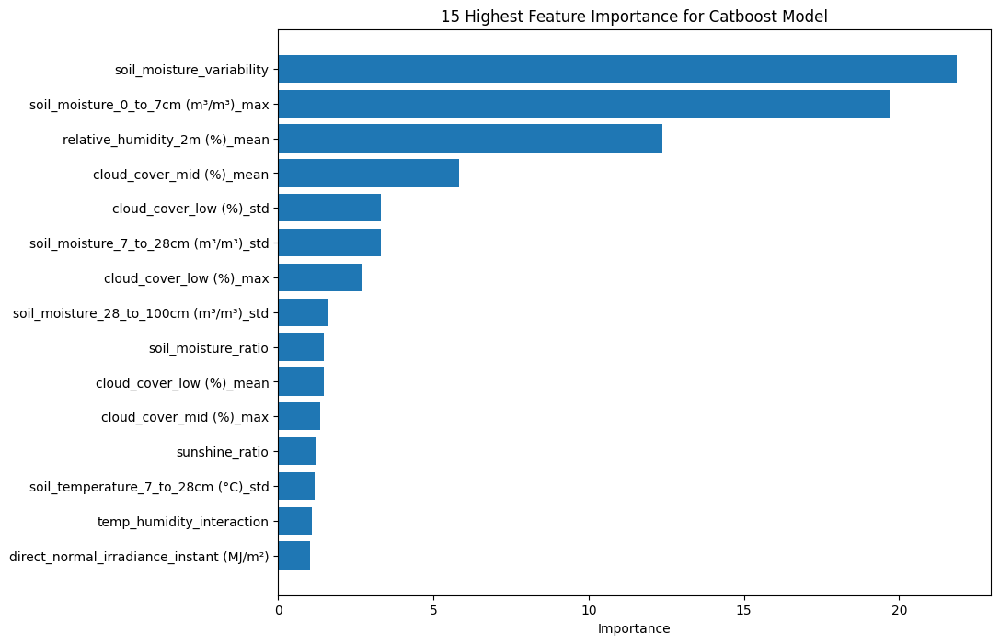

In [149]:
feat_importance = final_model.get_feature_importance()
feature_importance_df = pd.DataFrame({'Feature': X_train_split.columns, 'Importance': feat_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df = feature_importance_df[:15]

plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.title('15 Highest Feature Importance for Catboost Model')
plt.gca().invert_yaxis()
plt.show()

# Final Training, Save Model, Prediction, Postprocessing, and Submission

In [152]:
final_model = cb.CatBoostRegressor(iterations = 1500, loss_function = 'RMSE', depth = 6,
                                   learning_rate = 0.05, l2_leaf_reg = 10, bagging_temperature = 0.8,
                                   random_strength = 0.7, od_type = 'Iter', early_stopping_rounds=50,
                                   random_state=SEED, verbose=100)
final_model.fit(X_train, y_train)
with open("catboost_model.pkl", "wb") as file:
    pickle.dump(final_model, file)

0:	learn: 1.0876736	total: 33.9ms	remaining: 50.9s
100:	learn: 0.3816508	total: 2.63s	remaining: 36.4s
200:	learn: 0.3527529	total: 5.39s	remaining: 34.9s
300:	learn: 0.3327612	total: 10.4s	remaining: 41.5s
400:	learn: 0.3193953	total: 14.3s	remaining: 39.1s
500:	learn: 0.3085748	total: 17.1s	remaining: 34s
600:	learn: 0.2989896	total: 19.7s	remaining: 29.5s
700:	learn: 0.2906059	total: 22.3s	remaining: 25.5s
800:	learn: 0.2831081	total: 26.7s	remaining: 23.3s
900:	learn: 0.2758967	total: 29.5s	remaining: 19.6s
1000:	learn: 0.2690483	total: 32s	remaining: 16s
1100:	learn: 0.2630589	total: 34.5s	remaining: 12.5s
1200:	learn: 0.2573161	total: 37s	remaining: 9.21s
1300:	learn: 0.2518355	total: 41.7s	remaining: 6.38s
1400:	learn: 0.2462732	total: 44.2s	remaining: 3.12s
1499:	learn: 0.2412607	total: 46.6s	remaining: 0us


In [153]:
with open("catboost_model.pkl", "rb") as file:
    final_cb_model = pickle.load(file)

In [145]:
train = pd.concat([X_train_selected_final, y_train], axis=1)
test = X_test_selected_final

In [146]:
# Simpan hasil ke file CSV
train.to_csv("train_titik.csv", index=False)
test.to_csv("test_titik.csv", index=False)

# Unduh file
files.download("train_titik.csv")
files.download("test_titik.csv")

print("Gabungan data selesai! File disimpan sebagai train_titik.csv dan test_titik.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Gabungan data selesai! File disimpan sebagai train_titik.csv dan test_titik.csv


In [141]:
!gdown 1Kd9XFHuE7jeK51en8zbpCHjiWjwo90BZ

sample = pd.read_csv('/content/sample_submission.csv')

Downloading...
From: https://drive.google.com/uc?id=1Kd9XFHuE7jeK51en8zbpCHjiWjwo90BZ
To: /content/sample_submission.csv
100% 102k/102k [00:00<00:00, 9.01MB/s]


In [147]:
# Predict on Test Data
y_test_pred_log = final_model.predict(X_test)
y_test_pred = np.expm1(y_test_pred_log)  # Transform back from log scale
y_test_pred = np.maximum(0, y_test_pred)  # Ensure no negative values

# Prepare Submission for Kaggle
# Replace 'ID' with the actual ID column in your test data
submission = pd.DataFrame({'ID': sample['ID'], 'rain_sum (mm)': y_test_pred})

# Save to CSV
submission.to_csv('submission.csv', index=False)
print("Submission file saved as 'submission.csv'")

Submission file saved as 'submission.csv'
